# **Non Homogeneous Hidden Markov Model**

In [20]:
# Importar librerías necesarias
import pandas as pd
from rpy2.robjects import pandas2ri
from rpy2.robjects.packages import importr

# Habilitar conversión entre pandas y R
pandas2ri.activate()

In [21]:
from rpy2.robjects.packages import importr

# Cargar el paquete base de R
base = importr('base')

In [22]:
# Verificar conexión con R e intentar cargar un paquete
utils = importr('utils')  # Librería para gestionar paquetes en R

try:
    depmixS4 = importr('depmixS4')  # Intentar cargar depmixS4
    print("El paquete 'depmixS4' se cargó correctamente.")
except:
    print("El paquete 'depmixS4' no está instalado. Procediendo a instalar...")
    utils.install_packages('depmixS4')
    depmixS4 = importr('depmixS4')
    print("El paquete 'depmixS4' se instaló y cargó correctamente.")

El paquete 'depmixS4' se cargó correctamente.


## Library Loading and Configuration

In [23]:
import os
# os.environ["R_HOME"] = r"C:\Program Files\R\R-4.5.0"  # Change this path according to your R installation.

import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import matplotlib.dates as mdates

import seaborn as sns
import numpy as np
from rpy2.robjects import r, pandas2ri
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import IntVector

# Enable conversion between pandas and R
pandas2ri.activate()

# Load the R base package
base = importr('base')
# Load the package depmixS4
depmixS4 = importr("depmixS4")
# Set the seed in R for reproducibility
r('set.seed(2030)')
# Set seed in Python for reproducibility
np.random.seed(2030)

## Data loading and preparation:

In [24]:
covid_data = pd.read_excel('/Users/constanzaneiraurrutia/Desktop/ESCRITORIO/MAGÍSTER DATA SCIENCE/PUBLICACIÓN TESIS/ANÁLISIS DE DATOS/covid_data.xlsx')

In [25]:
covid_data.columns

Index(['IM_interno', 'IM_externo', 'inc_pc_comuna', 'TasaCasosAcumulados',
       'Personas_hogar_promedio', 'inmigrantes', 'total_hog_hacinados',
       'indic_precariedad_vivienda', 'Comuna', 'fecha', 'dias', 'por_educ_sup',
       'porc_postgrado', 'IPS_2020', 'Prioridad_2020', 'CODIGO', 'year',
       'month', 'paso', 'paso_etiqueta', 'Fecha inicio cuarentena',
       'Fecha término cuarentena', 'Casos_Diarios_Brutos',
       'Casos_Diarios_Brutos_MM7'],
      dtype='object')

In [26]:
covid_data.rename(columns={'IM_interno': 'Internal_Mobility_Index',
                           'IM_externo': 'External_Mobility_Index',
                           'inc_pc_comuna': 'Per_Capita_Income',
                           'TasaCasosAcumulados': 'Cumulative_Cases_Rate',
                           'Personas_hogar_promedio': 'Average_Household_Persons',
                           'inmigrantes': 'Inmigrants',
                           'total_hog_hacinados': 'Total_Households_Housed',
                           'indic_precariedad_vivienda': 'Housing_Precariousness_Index',
                           'Comuna': 'Commune',
                           'fecha': 'Date',
                           'dias': 'Days',
                           'por_educ_sup': 'Higher_Education_Percentage',
                           'porc_postgrado': 'Postgraduade_Percentage',
                           'IPS_2020': 'Social_Priority_Index_2020',
                           'Prioridad_2020': 'Priority_2020',
                           'CODIGO':'Code',
                           'year': 'Year',
                           'month': 'Month',
                           'paso': 'Step',
                           'paso_etiqueta': 'Step_Label',
                           'Fecha inicio cuarentena': 'Quarantine_Start_Date',
                           'Fecha término cuarentena': 'Quarantine_End_Date',
                           'Casos_Diarios_Brutos': 'Gross_Daily_Cases',
                           'Casos_Diarios_Brutos_MM7': 'Gross_Daily_Cases_Mobile_Average_7_Days'}, inplace=True)

In [27]:
covid_data.columns

Index(['Internal_Mobility_Index', 'External_Mobility_Index',
       'Per_Capita_Income', 'Cumulative_Cases_Rate',
       'Average_Household_Persons', 'Inmigrants', 'Total_Households_Housed',
       'Housing_Precariousness_Index', 'Commune', 'Date', 'Days',
       'Higher_Education_Percentage', 'Postgraduade_Percentage',
       'Social_Priority_Index_2020', 'Priority_2020', 'Code', 'Year', 'Month',
       'Step', 'Step_Label', 'Quarantine_Start_Date', 'Quarantine_End_Date',
       'Gross_Daily_Cases', 'Gross_Daily_Cases_Mobile_Average_7_Days'],
      dtype='object')

### Dictionary of variables:
- **'Internal_Mobility_Index'**: Index of internal mobility of the communes.
- **'External_Mobility_Index'**: Index of external mobility of the communes.
- **'Per_Capita_Income'**: Per capita income of the communes.
- **'Cumulative_Cases_Rate'**: Cumulative case rate per 100,000 population.
- **'Average_Household_Persons'**: Average number of persons per household in the communes.
- **'Inmigrants'**: Percentage of immigrants in the communes.
- **'Total_Households_Housed'**: Percentage of overcrowded households in the communes.
- **'Housing_Precariousness_Index'**: Indicator of housing precariousness in the municipalities.
- **'Commune'**: Name of the commune.
- **'Date'**: Date of observation.
- **'Days'**: Number of days since the beginning of the records.
- **'Higher_Education_Percentage'**: Percentage of people with higher education in the communes.
- **'Postgraduade_Percentage'**: Percentage of people with a postgraduate degree in the communes.
- **'Social_Priority_Index_2020'**: Social Priority Index 2020 of the communes.
- **'Priority_2020'**: 2020 Social Priority of the communes.
- **'Code'**: Code of the commune.
- **'Year'**: Year of observation.
- **'Month'**: Month of observation.
- **'Step'**: Commune Step by Step Plan.
- **'Step_Label'**: Label of the commune's passage in the Step by Step Plan.
- **'Quarantine_Start_Date'**: Quarantine start date.
- **'Quarantine_End_Date'**: Date of end of quarantine.
- **'Gross_Daily_Cases'**: Number of gross daily cases.
- **'Gross_Daily_Cases_Mobile_Average_7_Days'**: Number of gross daily cases with 7-day moving average.

In [28]:
# Remove rows with null values in the relevant columns:
#covid_data = covid_data.dropna(subset=['Gross_Daily_Cases', 'Gross_Daily_Cases_Mobile_Average_7_Days', 'Date'])
# Reset index and add row_id for merge:
#covid_data = covid_data.reset_index(drop=True)
#covid_data['row_id'] = covid_data.index  # for subsequent merge

### Urban Quality

In [29]:
urban_quality= pd.read_csv('/Users/constanzaneiraurrutia/Desktop/ESCRITORIO/MAGÍSTER DATA SCIENCE/PUBLICACIÓN TESIS/ANÁLISIS DE DATOS/covid_data_urban_quality.csv')

In [30]:
print(urban_quality.columns)

Index(['Internal_Mobility_Index', 'External_Mobility_Index',
       'Per_Capita_Income', 'Cumulative_Cases_Rate',
       'Average_Household_Persons', 'Inmigrants', 'Total_Households_Housed',
       'Housing_Precariousness_Index', 'Commune', 'Date', 'Days',
       'Higher_Education_Percentage', 'Postgraduade_Percentage',
       'Social_Priority_Index_2020', 'Priority_2020', 'Code', 'Year', 'Month',
       'Step', 'Step_Label', 'Quarantine_Start_Date', 'Quarantine_End_Date',
       'Gross_Daily_Cases', 'Gross_Daily_Cases_Mobile_Average_7_Days',
       'Connectivity_and_Mobility', 'Housing_and_Environment',
       'Labor_Conditions', 'Business_Environment', 'Health_and_Environment',
       'Socio_cultural_conditions', 'Urban_Quality_of_Life_Index_2024'],
      dtype='object')


In [31]:
covid_data = pd.read_csv('/Users/constanzaneiraurrutia/Desktop/ESCRITORIO/MAGÍSTER DATA SCIENCE/PUBLICACIÓN TESIS/ANÁLISIS DE DATOS/covid_data_urban_quality.csv')

In [32]:
covid_data.columns

Index(['Internal_Mobility_Index', 'External_Mobility_Index',
       'Per_Capita_Income', 'Cumulative_Cases_Rate',
       'Average_Household_Persons', 'Inmigrants', 'Total_Households_Housed',
       'Housing_Precariousness_Index', 'Commune', 'Date', 'Days',
       'Higher_Education_Percentage', 'Postgraduade_Percentage',
       'Social_Priority_Index_2020', 'Priority_2020', 'Code', 'Year', 'Month',
       'Step', 'Step_Label', 'Quarantine_Start_Date', 'Quarantine_End_Date',
       'Gross_Daily_Cases', 'Gross_Daily_Cases_Mobile_Average_7_Days',
       'Connectivity_and_Mobility', 'Housing_and_Environment',
       'Labor_Conditions', 'Business_Environment', 'Health_and_Environment',
       'Socio_cultural_conditions', 'Urban_Quality_of_Life_Index_2024'],
      dtype='object')

In [33]:
# Remove rows with null values in the relevant columns:
covid_data = covid_data.dropna(subset=['Gross_Daily_Cases', 'Gross_Daily_Cases_Mobile_Average_7_Days', 'Date'])
# Reset index and add row_id for merge:
covid_data = covid_data.reset_index(drop=True)
covid_data['row_id'] = covid_data.index  # for subsequent merge

In [34]:
covid_data.columns

Index(['Internal_Mobility_Index', 'External_Mobility_Index',
       'Per_Capita_Income', 'Cumulative_Cases_Rate',
       'Average_Household_Persons', 'Inmigrants', 'Total_Households_Housed',
       'Housing_Precariousness_Index', 'Commune', 'Date', 'Days',
       'Higher_Education_Percentage', 'Postgraduade_Percentage',
       'Social_Priority_Index_2020', 'Priority_2020', 'Code', 'Year', 'Month',
       'Step', 'Step_Label', 'Quarantine_Start_Date', 'Quarantine_End_Date',
       'Gross_Daily_Cases', 'Gross_Daily_Cases_Mobile_Average_7_Days',
       'Connectivity_and_Mobility', 'Housing_and_Environment',
       'Labor_Conditions', 'Business_Environment', 'Health_and_Environment',
       'Socio_cultural_conditions', 'Urban_Quality_of_Life_Index_2024',
       'row_id'],
      dtype='object')

## Exploratory Data Analysis (EDA):

### Gross Daily Cases with 7-day moving average:

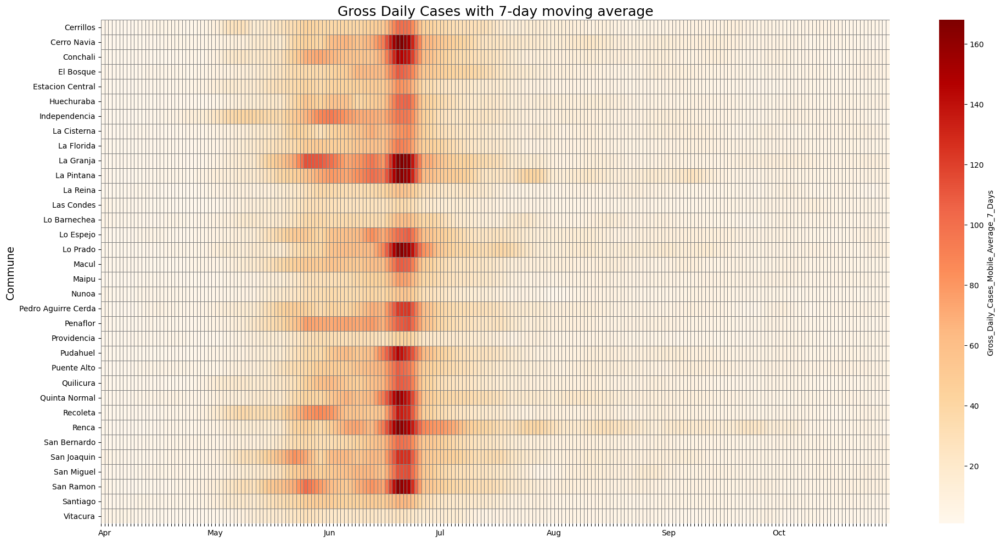

In [35]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Definir rango de fechas
min_date = pd.Timestamp('2020-03-31')
max_date = pd.Timestamp('2020-10-30')

covid_data['Date'] = pd.to_datetime(covid_data['Date'])

# Paso 1: Convertir 'Days' a datetime si no lo es
if not pd.api.types.is_datetime64_any_dtype(covid_data['Days']):
    reference_date = covid_data['Date'].min()
    covid_data['Days'] = reference_date + pd.to_timedelta(covid_data['Days'], unit='D')


# Paso 2: Crear la tabla pivot
covid_pivot = covid_data.pivot(index='Commune', columns='Date', values='Gross_Daily_Cases_Mobile_Average_7_Days')

# Paso 3: Filtrar fechas

filtered_columns = [col for col in covid_pivot.columns if min_date <= col <= max_date]
covid_pivot = covid_pivot[filtered_columns]

# Valores mínimos y máximos personalizados para mejorar contraste
vmin = covid_pivot.quantile(0.05).min()  # mínimo más robusto
vmax = covid_pivot.quantile(0.95).max()  # máximo más robusto

# Crear el gráfico
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(
    covid_pivot,
    cmap='OrRd',
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Gross_Daily_Cases_Mobile_Average_7_Days'},
    vmin=vmin,  # limitar escala inferior
    vmax=vmax,  # limitar escala superior
    ax=ax
)


# Etiquetas de ejes
ax.set_xlabel(None)
ax.set_ylabel("Commune", fontsize=14)

# Mostrar etiquetas solo para primeros días del mes
tick_positions = list(range(len(filtered_columns)))
tick_labels = [
    date.strftime('%b') if date.day == 1 else ''
    for date in filtered_columns
]
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels, rotation=0, fontsize=10)

plt.title('Gross Daily Cases with 7-day moving average', fontsize=18)
plt.tight_layout()
plt.show()


### Internal Mobility Index of each commune over time:

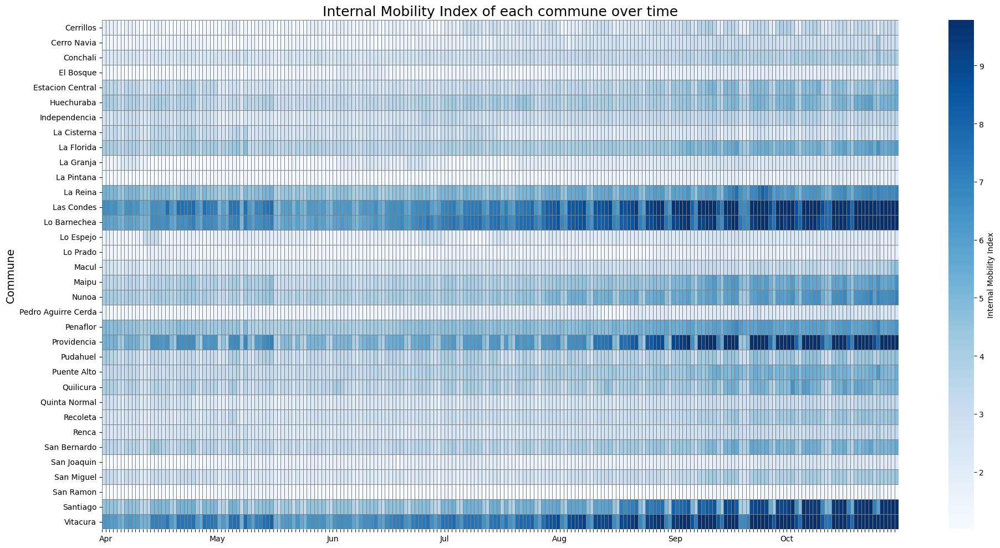

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Definir rango de fechas
min_date = pd.Timestamp('2020-03-31')
max_date = pd.Timestamp('2020-10-30')

covid_data['Date'] = pd.to_datetime(covid_data['Date'])

# Crear tabla pivot
covid_pivot = covid_data.pivot(index='Commune', columns='Date', values='Internal_Mobility_Index')

# Filtrar fechas
filtered_columns = [col for col in covid_pivot.columns if min_date <= col <= max_date]
covid_pivot = covid_pivot[filtered_columns]

# Crear gráfico
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(
    covid_pivot,
    cmap='Blues',  # 💙 paleta azul
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'Internal Mobility Index'},
    robust=True,  # 🔍 mejora el contraste sin outliers extremos
    ax=ax
)

# Etiquetas de ejes
ax.set_xlabel(None)
ax.set_ylabel("Commune", fontsize=14)

# Etiquetas del eje x (solo nombre del mes en el primer día)
tick_positions = list(range(len(filtered_columns)))
tick_labels = [
    date.strftime('%b') if date.day == 1 else ''
    for date in filtered_columns
]

ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels, rotation=0, fontsize=10)

# Título
plt.title('Internal Mobility Index of each commune over time', fontsize=18)

# Ajustar diseño
plt.tight_layout()
plt.show()


### External Mobility Index of each commune over time:

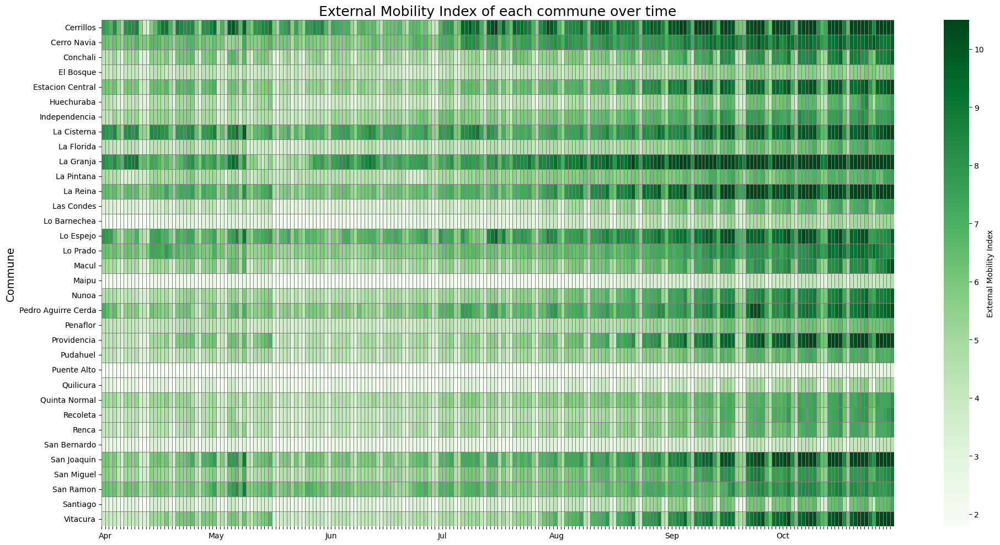

In [37]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Definir rango de fechas
min_date = pd.Timestamp('2020-03-31')
max_date = pd.Timestamp('2020-10-30')

covid_data['Date'] = pd.to_datetime(covid_data['Date'])

# Crear la tabla pivot con el índice de movilidad externa
covid_pivot = covid_data.pivot(index='Commune', columns='Date', values='External_Mobility_Index')

# Filtrar columnas por rango de fechas
filtered_columns = [col for col in covid_pivot.columns if min_date <= col <= max_date]
covid_pivot = covid_pivot[filtered_columns]

# Crear el heatmap
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(
    covid_pivot,
    cmap='Greens',  # 💚 Paleta verde clara a intensa
    linewidths=0.5,
    linecolor='gray',
    cbar_kws={'label': 'External Mobility Index'},
    robust=True,  # Mejora el contraste
    ax=ax
)

# Etiquetas de ejes
ax.set_xlabel(None)
ax.set_ylabel("Commune", fontsize=14)

# Etiquetas del eje x (solo el nombre del mes si es el primer día)
tick_positions = list(range(len(filtered_columns)))
tick_labels = [
    date.strftime('%b') if date.day == 1 else ''
    for date in filtered_columns
]

ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels, rotation=0, fontsize=10)

# Título
plt.title('External Mobility Index of each commune over time', fontsize=18)

# Ajustar diseño
plt.tight_layout()
plt.show()


### Step by Step Plan:

In [38]:
covid_data['Step_Label'].unique()

array(['Sin Medida', 'Cuarentena', 'Transición', 'Preparación',
       'Apertura'], dtype=object)

In [39]:
# Rearrange the Step by Step_Label
remap_step = {'Sin Medida': 'Unrestricted', 'Cuarentena': 'Quarantine', 'Transición':'Transition', 'Preparación':'Preparation','Apertura':'Opening'}
covid_data['Step_Label'] = covid_data['Step_Label'].map(remap_step)

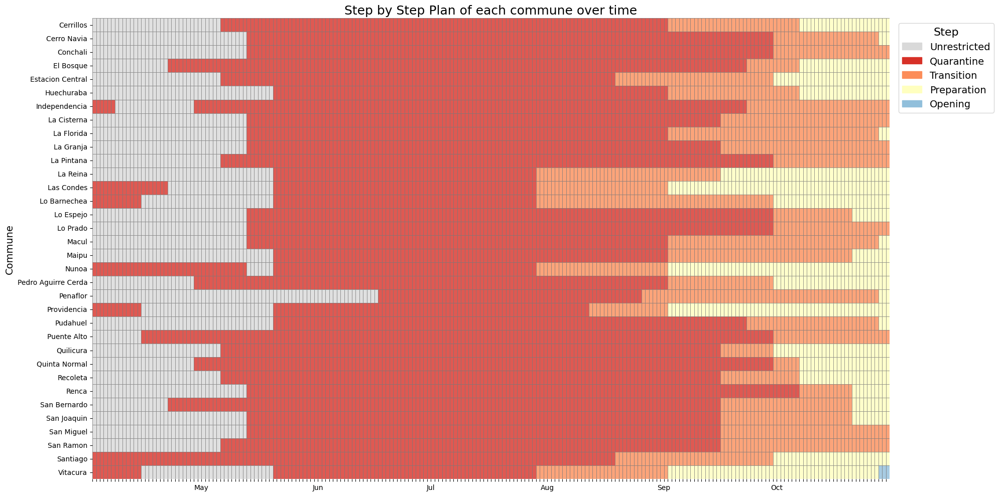

In [40]:
# Definir el rango de fechas
min_date = pd.Timestamp('2020-03-31')
max_date = pd.Timestamp('2020-10-30')

# Crear la tabla pivot de los pasos
covid_pivot = covid_data.pivot(index='Commune', columns='Days', values='Step')

# Filtrar columnas dentro del rango de fechas
filtered_columns = [col for col in covid_pivot.columns if min_date <= col <= max_date]
covid_pivot = covid_pivot[filtered_columns]

# Nueva paleta con amarillo para Preparación y azul para Apertura
step_colors = ['#d9d9d9', '#d73027', '#fc8d59', '#ffffbf', '#91bfdb']
step_labels = ['Unrestricted', 'Quarantine', 'Transition', 'Preparation', 'Opening']

# Crear el heatmap
fig, ax = plt.subplots(figsize=(20, 10))
sns.heatmap(
    covid_pivot,
    cmap=sns.color_palette(step_colors, as_cmap=True),
    linewidths=0.5,
    linecolor='gray',
    cbar=False,
    ax=ax,
    alpha=0.8  # Ajustar la transparencia
)

# Etiquetas del eje
ax.set_xlabel(None)
ax.set_ylabel("Commune", fontsize=14)

# Etiquetas del eje x: mostrar solo nombre del mes si es el primer día
tick_positions = list(range(len(filtered_columns)))
tick_labels = [
    date.strftime('%b') if date.day == 1 else ''
    for date in filtered_columns
]
ax.set_xticks(tick_positions)
ax.set_xticklabels(tick_labels, rotation=0, fontsize=10)

# Crear leyenda personalizada
legend_handles = [
    mpatches.Patch(color=color, label=label)
    for color, label in zip(step_colors, step_labels)
]

plt.legend(
    handles=legend_handles,
    title="Step",
    bbox_to_anchor=(1.005, 1),
    loc='upper left',
    fontsize=14,
    title_fontsize=16
)

# Título del gráfico
plt.title('Step by Step Plan of each commune over time', fontsize=18)

# Ajustar diseño
plt.tight_layout()
plt.show()

## Definition of HMM model formulas:

Create `ntimes` from clean data

In [41]:
# Create `ntimes` from clean data
ntimes = IntVector(covid_data.groupby("Commune")["Days"].count().tolist())

# Validate consistency:
print(sum(ntimes))        # Total observations (must match len(covid_data))
print(len(covid_data))    # To check alignment

7276
7276


### Convert to R format:

In [42]:
pandas2ri.activate()
covid_data_r = pandas2ri.py2rpy(covid_data)

The transition probabilities between states depend on the covariates ‘IM_internal’, ‘IM_external’ and the commune

In [43]:
# Main observation:
hmm_formula = r("as.formula")("Gross_Daily_Cases_Mobile_Average_7_Days ~ 1")

# Transition covariates:
trans_formula = r("as.formula")("~ Internal_Mobility_Index + External_Mobility_Index + Commune")

# Distribution of observation:
gaussian_family = r['gaussian']()

### Creation of the HMM model:

In [44]:
hmm_model = depmixS4.depmix( 
    response=hmm_formula, # Main observation
    nstates=3,  # Number of hidden states
    family=gaussian_family,  # Distribution of observation
    data=covid_data_r, # Data
    transition=trans_formula, # Transition covariates
    ntimes=ntimes # Number of observations per group
)

print("HMM model configured:")
print(hmm_model)

HMM model configured:
Initial state probabilities model 
  pr1   pr2   pr3 
0.333 0.333 0.333 

Transition model for state (component) 1 
Model of type multinomial (mlogit), formula: ~Internal_Mobility_Index + External_Mobility_Index + Commune
Coefficients: 
                           St1 St2 St3
(Intercept)                  0   0   0
Internal_Mobility_Index      0   0   0
External_Mobility_Index      0   0   0
CommuneCerro Navia           0   0   0
CommuneConchali              0   0   0
CommuneEl Bosque             0   0   0
CommuneEstacion Central      0   0   0
CommuneHuechuraba            0   0   0
CommuneIndependencia         0   0   0
CommuneLa Cisterna           0   0   0
CommuneLa Florida            0   0   0
CommuneLa Granja             0   0   0
CommuneLa Pintana            0   0   0
CommuneLa Reina              0   0   0
CommuneLas Condes            0   0   0
CommuneLo Barnechea          0   0   0
CommuneLo Espejo             0   0   0
CommuneLo Prado              0   0   0


## Model adjustment:

In [45]:
# Adjust the HMM model
hmm_fitted = depmixS4.fit(hmm_model)

# Verify adjusted model information
print("\nAdjusted HMM model:")
print(hmm_fitted)


converged at iteration 39 with logLik: -22164.39 

Adjusted HMM model:
Convergence info: Log likelihood converged to within tol. (relative change) 
'log Lik.' -22164.39 (df=224)
AIC:  44776.78 
BIC:  46320.67 



### Evaluación 2 a 9 Estados

In [46]:
from rpy2.robjects import r, pandas2ri
import pandas as pd

# Vamos a guardar los resultados
aic_values = []
bic_values = []
logLik_values = []
n_states_list = []

# Loop para ajustar modelos de 2 a 5 estados
for n_states in range(2, 9):
    print(f"⚙️ Ajustando modelo con {n_states} estados...")
    
    # Definir el modelo
    if n_states == 2:
        # Para 2 estados: transición simple (sin covariables)
        hmm_model_n = depmixS4.depmix(
            response=hmm_formula,
            nstates=n_states,
            family=gaussian_family,
            data=covid_data_r,
            ntimes=ntimes
        )
    else:
        # Para 3, 4, 5 estados: transición con covariables
        hmm_model_n = depmixS4.depmix(
            response=hmm_formula,
            nstates=n_states,
            family=gaussian_family,
            data=covid_data_r,
            transition=trans_formula,
            ntimes=ntimes
        )
    
    # Ajustar
    hmm_fitted_n = depmixS4.fit(hmm_model_n, verbose=False)
    
    # Guardar métricas
    n_states_list.append(n_states)
    aic_values.append(r['AIC'](hmm_fitted_n)[0])
    bic_values.append(r['BIC'](hmm_fitted_n)[0])
    logLik_values.append(r['logLik'](hmm_fitted_n)[0])

# Crear DataFrame con los resultados
model_fit_df = pd.DataFrame({
    'Number_of_States': n_states_list,
    'AIC': aic_values,
    'BIC': bic_values,
    'LogLikelihood': logLik_values
})

# Mostrar tabla
print("\nResultados del ajuste:")
print(model_fit_df)

⚙️ Ajustando modelo con 2 estados...
converged at iteration 23 with logLik: -24794.63 
⚙️ Ajustando modelo con 3 estados...
converged at iteration 31 with logLik: -22255.12 
⚙️ Ajustando modelo con 4 estados...
converged at iteration 178 with logLik: -20448.47 
⚙️ Ajustando modelo con 5 estados...
converged at iteration 69 with logLik: -18995.43 
⚙️ Ajustando modelo con 6 estados...
converged at iteration 44 with logLik: -17918.08 
⚙️ Ajustando modelo con 7 estados...
converged at iteration 111 with logLik: -16985.65 
⚙️ Ajustando modelo con 8 estados...
converged at iteration 139 with logLik: -16332.82 

Resultados del ajuste:
   Number_of_States           AIC           BIC  LogLikelihood
0                 2  49603.264479  49651.510835  -24794.632239
1                 3  44958.235844  46502.119229  -22255.117922
2                 4  41782.933997  44836.239084  -20448.466998
3                 5  39458.861921  44517.836941  -18995.430961
4                 6  38030.150343  45591.043527  

/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: Futur

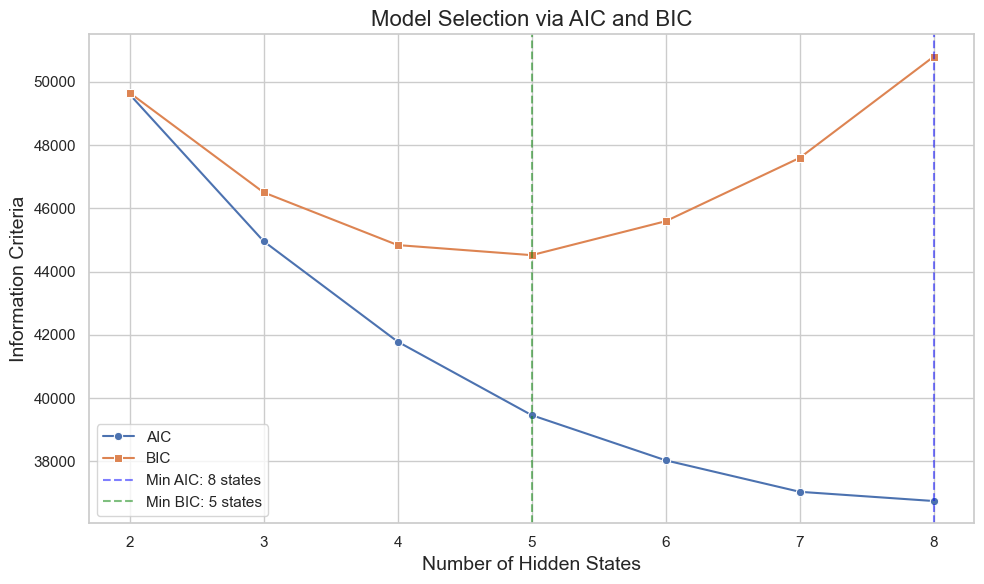

In [47]:
import matplotlib.pyplot as plt
import seaborn as sns

# Asegúrate de tener model_fit_df definido con columnas: 'Number_of_States', 'AIC', 'BIC'
plt.figure(figsize=(10, 6))
sns.set(style="whitegrid")

# Gráfico AIC y BIC
sns.lineplot(data=model_fit_df, x='Number_of_States', y='AIC', marker='o', label='AIC')
sns.lineplot(data=model_fit_df, x='Number_of_States', y='BIC', marker='s', label='BIC')

# Opcional: marcar el mínimo
min_aic_state = model_fit_df.loc[model_fit_df['AIC'].idxmin(), 'Number_of_States']
min_bic_state = model_fit_df.loc[model_fit_df['BIC'].idxmin(), 'Number_of_States']

plt.axvline(min_aic_state, color='blue', linestyle='--', alpha=0.5, label=f'Min AIC: {min_aic_state} states')
plt.axvline(min_bic_state, color='green', linestyle='--', alpha=0.5, label=f'Min BIC: {min_bic_state} states')

# Ajustes del gráfico
plt.title('Model Selection via AIC and BIC', fontsize=16)
plt.xlabel('Number of Hidden States', fontsize=14)
plt.ylabel('Information Criteria', fontsize=14)
plt.legend()
plt.tight_layout()
plt.show()


We evaluated models with increasing numbers of hidden states (from 2 to 8) using the Akaike Information Criterion (AIC) and Bayesian Information Criterion (BIC). As shown in Figure~X, AIC continued to decrease with additional states, while BIC reached its minimum at five states, indicating an optimal trade-off between model fit and complexity. However, to ensure clarity and interpretability of the latent epidemic stages, we selected a three-state model for the main analysis. This choice is further supported by epidemiological reasoning and aligns with the observable phases of transmission intensity. Models with 4 and 5 states, while more granular, are presented in the Supplementary Material to demonstrate the robustness of our approach.


Escrito profe:

To determine the optimal number of hidden states for the non-homogeneous Hidden Markov Model (nHMM), we evaluated models with increasing numbers of states (from 2 to 8) using the Akaike Information Criterion (AIC), Bayesian Information Criterion (BIC) and log-likelihood values (Table~X). Although both AIC and BIC improved with the addition of more states, the marginal gains diminished substantially beyond three states. Models with four and five states captured finer epidemic nuances, such as differences in transmission dynamics among communes with distinct socioeconomic profiles. However, for the purposes of clarity, interpretability, and epidemiological relevance, we selected the three-state model for primary analysis. The three latent states corresponded to different phases of epidemic severity: moderate transmission (State 1), severe transmission (State 2), and critical transmission (State 3). Extended models with four and five states, highlighting additional granularity, are included in the Supplementary Material to support the robustness of our findings.

## Simulaciones

✅ PASO 1: Transformar los datos con Box-Cox desde Python usando R

Este paso transforma la columna Gross_Daily_Cases_Mobile_Average_7_Days aplicando una transformación de Box-Cox con λ = 0.01.

In [48]:
from rpy2.robjects import r, pandas2ri
pandas2ri.activate()

# Asegúrate de haber definido estas variables previamente
# covid_data : tu DataFrame original
# ntimes     : vector de longitud por comuna para depmixS4

# Enviar datos a R
r.assign("covid_data_r", pandas2ri.py2rpy(covid_data))
r.assign("ntimes", pandas2ri.py2rpy(ntimes))

# Ejecutar Box-Cox en R
r('''
library(depmixS4)
library(MASS)

lambda <- 0.01  # valor fijo
covid_data_r$boxcox_cases <- ifelse(
  covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days > 0,
  (covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days^lambda - 1) / lambda,
  0
)
''')


✅ PASO 2: Ajustar el modelo nHMM con la variable transformada

Este código entrena el HMM usando la variable boxcox_cases con 3 estados.

In [49]:
from rpy2.robjects import Formula
from rpy2.robjects.packages import importr

# Cargar el paquete depmixS4
depmixS4 = importr("depmixS4")

# Fórmulas
hmm_formula = Formula("boxcox_cases ~ 1")
trans_formula = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")
gaussian_family = r["gaussian"]()

# Crear y ajustar el modelo con 3 estados
hmm_model = depmixS4.depmix(
    response=hmm_formula,
    data=r["covid_data_r"],
    nstates=3,  # o 5 si quieres repetir como el profe
    family=gaussian_family,
    transition=trans_formula,
    ntimes=r["ntimes"]
)

hmm_fitted = depmixS4.fit(hmm_model, verbose=False)
r.assign("hmm_fitted", hmm_fitted)


converged at iteration 67 with logLik: -4739.804 


<rpy2.robjects.methods.RS4 object at 0x16bbb1480> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

✅ PASO 3: Simular desde el modelo y aplicar la inversa de Box-Cox

Simulamos 100 veces y deshacemos la transformación.

In [50]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)  # Inversa de Box-Cox
}}
sim_df <- as.data.frame(do.call(cbind, simulaciones_list))
colnames(sim_df) <- paste0("sim_", 1:{N_sim})
sim_df$Commune <- covid_data_r$Commune
sim_df$Date <- as.character(covid_data_r$Date)
''')


✅ PASO 4: Convertir las simulaciones de R a Pandas

Este paso trae el data.frame sim_df desde R a Python y convierte la columna Date a tipo fecha para graficar correctamente:

In [51]:
# Traer desde R
sim_df = pandas2ri.rpy2py(r['sim_df'])

# Asegurarse que la columna Date está en formato datetime
sim_df['Date'] = pd.to_datetime(sim_df['Date'])

# Vista previa
print(sim_df.head())


      sim_1      sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  5.274921   6.850848  5.658933  3.122565  7.862783  2.355768  2.742851   
2  5.900193   3.853332  2.172033  2.034255  4.754523  3.273813  3.645716   
3  2.818971   6.339377  4.596461  1.401991  4.867049  6.256204  3.414766   
4  6.261434   2.698925  4.438836  8.850212  5.265453  3.974569  3.567357   
5  7.132869  11.217610  5.494848  7.214887  2.564341  5.060220  6.888244   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94     sim_95  \
1  4.166710  4.600548  2.807856  ...  2.493375  3.190716   3.482519   
2  9.232054  9.639630  2.628468  ...  2.583760  4.355419   9.096139   
3  6.009414  3.480441  4.839833  ...  5.431903  2.348976  25.289809   
4  6.999016  2.565481  2.262141  ...  6.372877  2.016058  62.145852   
5  2.797342  4.156543  5.579640  ...  7.557360  6.690554  50.314811   

      sim_96    sim_97     sim_98    sim_99   sim_100    Commune       Date  
1  10.141815  4.537240  11.532043  7.9

✅ PASO 5: Visualizar simulaciones vs. datos reales

Este paso generará gráficos para comparar las simulaciones con los datos reales en comunas seleccionadas. 

Vamos a usar:
- Línea negra: casos reales (media móvil 7 días)
- Franja gris: IQR (percentil 25–75)
- Línea azul: mediana de las simulaciones
- Línea roja: media de las simulaciones

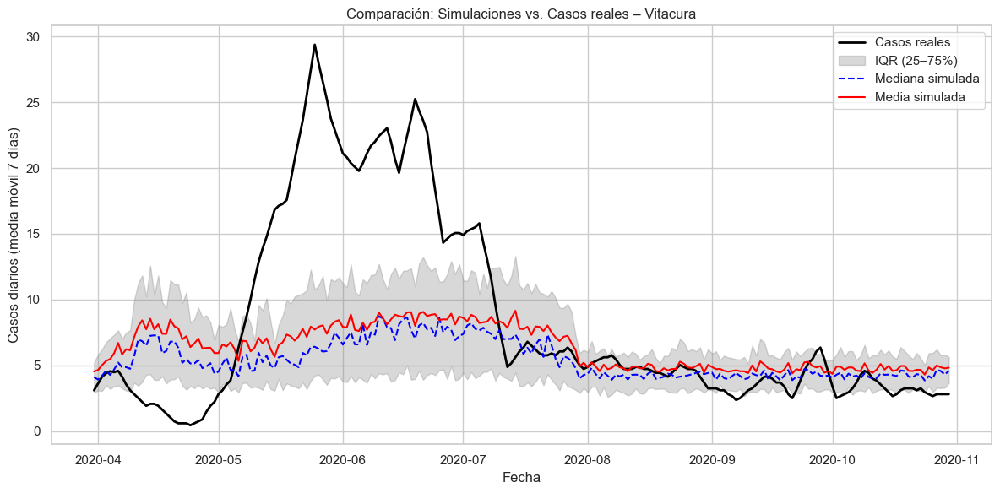

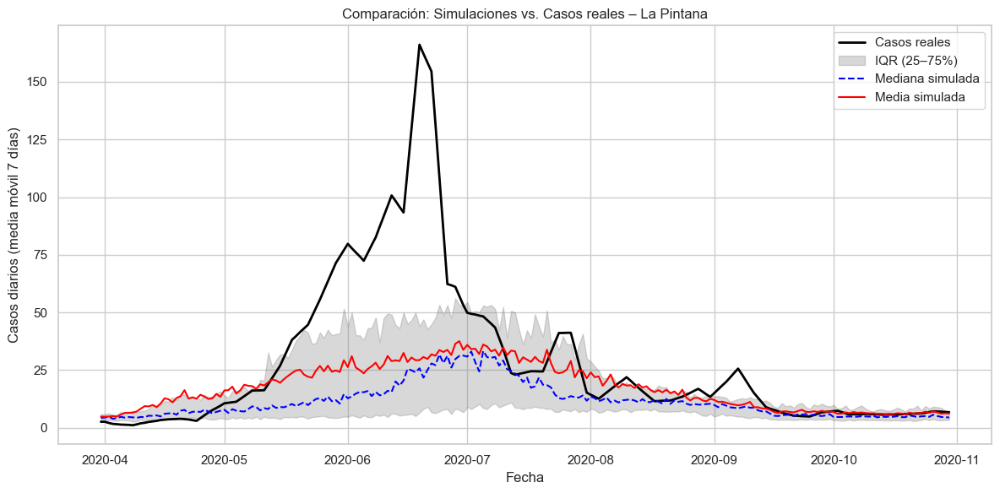

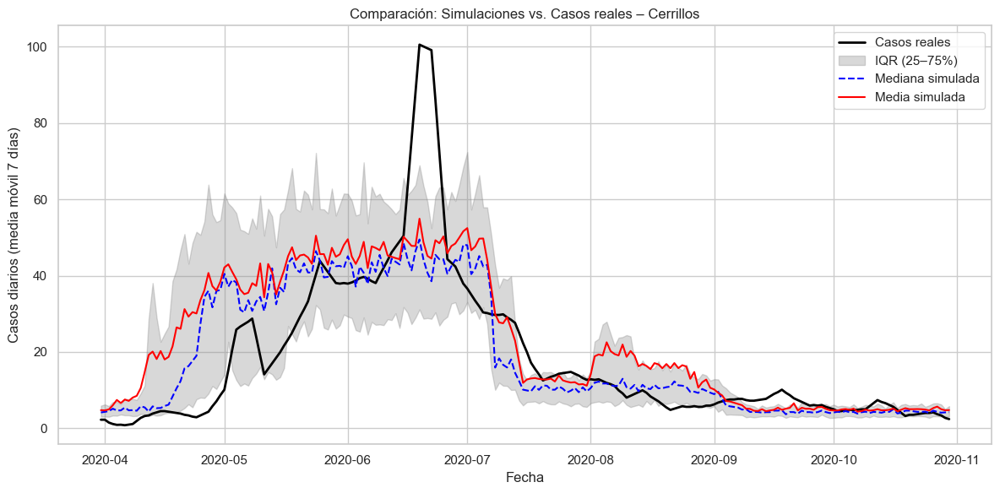

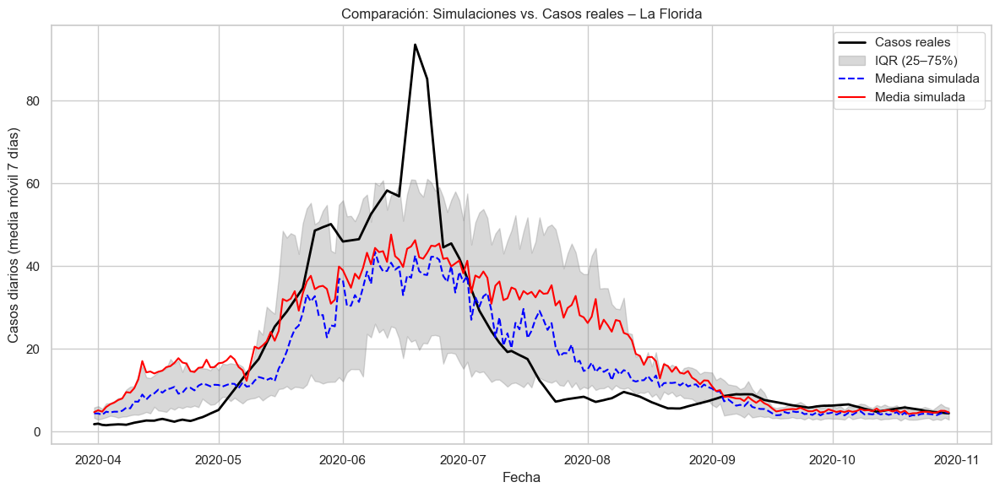

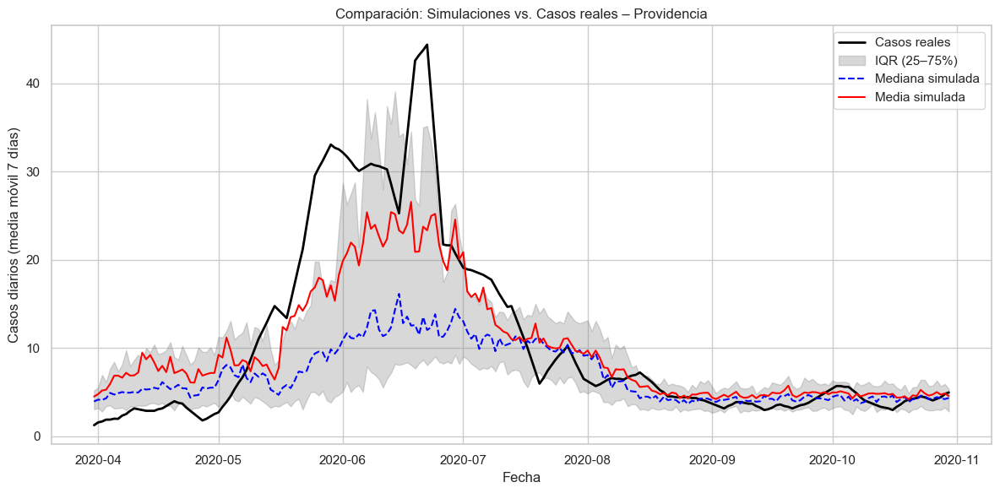

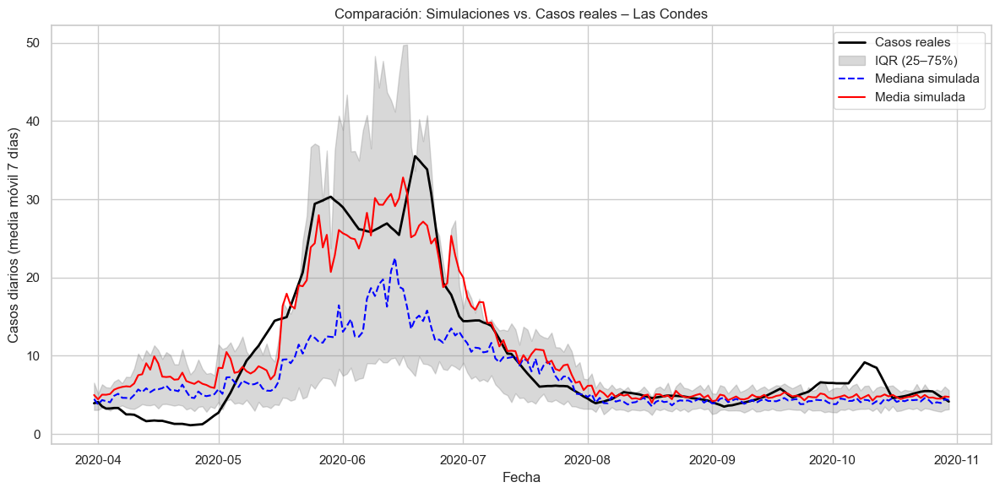

In [52]:
import matplotlib.pyplot as plt
import numpy as np

# Comunas de ejemplo (puedes cambiar o ampliar)
target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data[covid_data["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Datos simulados
    df_sim = sim_df[sim_df["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Comparación: Simulaciones vs. Casos reales – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [53]:
from sklearn.metrics import mean_squared_error

# Lista de comunas a evaluar (puedes usar covid_data['Commune'].unique())
comunas_unicas = covid_data['Commune'].unique()

rmse_por_comuna = {}

for comuna in comunas_unicas:
    df_real = covid_data[covid_data['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df[sim_df['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    # Asegurarse que las longitudes coinciden
    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_por_comuna[comuna] = rmse

# Convertir a DataFrame ordenado
rmse_df = pd.DataFrame(list(rmse_por_comuna.items()), columns=['Commune', 'RMSE'])
rmse_df = rmse_df.sort_values('RMSE', ascending=False)

# Mostrar las peores y mejores
print("🔴 Comunas con mayor error:")
print(rmse_df.head(10))

print("\n🟢 Comunas con menor error:")
print(rmse_df.tail(10))


🔴 Comunas con mayor error:
          Commune       RMSE
31      San Ramon  35.852861
9       La Granja  31.110880
10     La Pintana  30.043766
15       Lo Prado  28.738445
29    San Joaquin  25.451001
27          Renca  25.216886
1     Cerro Navia  25.059265
25  Quinta Normal  23.930332
22       Pudahuel  22.813177
7     La Cisterna  22.699910

🟢 Comunas con menor error:
             Commune       RMSE
8         La Florida  12.831258
17             Maipu   9.173626
32          Santiago   8.566416
4   Estacion Central   8.318870
13      Lo Barnechea   7.271782
33          Vitacura   6.924621
18             Nunoa   6.567203
11          La Reina   6.400087
21       Providencia   5.533006
12        Las Condes   3.310633


/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


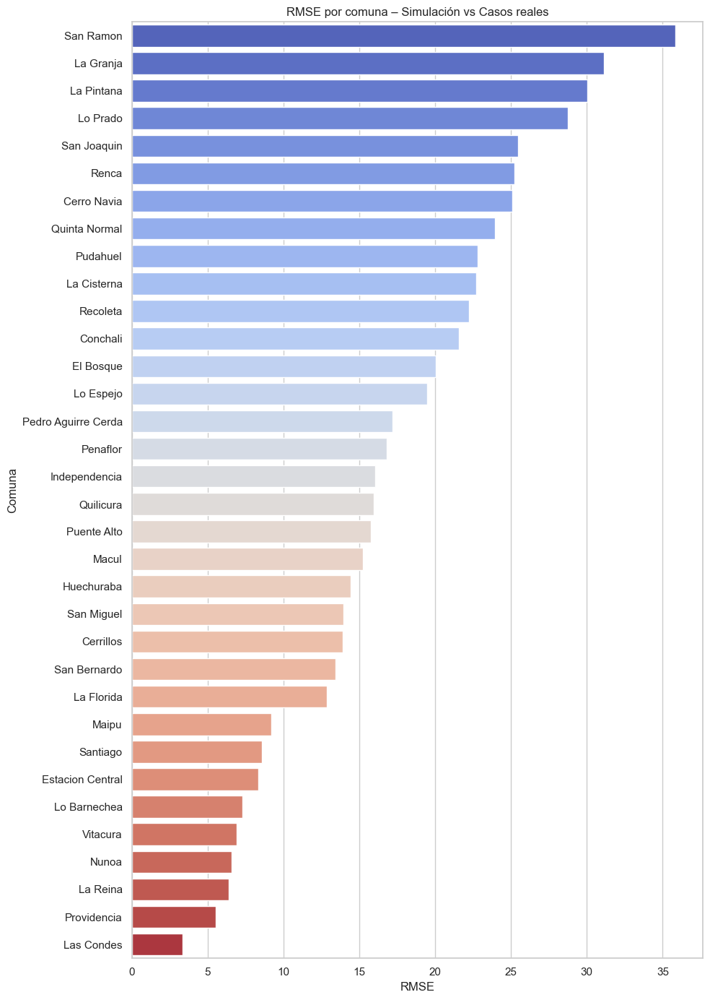

In [54]:
import seaborn as sns

plt.figure(figsize=(10, 14))
sns.barplot(data=rmse_df, y='Commune', x='RMSE', palette='coolwarm')
plt.title('RMSE por comuna – Simulación vs Casos reales')
plt.xlabel('RMSE')
plt.ylabel('Comuna')
plt.tight_layout()
plt.show()


### Estrategia 1 para mejorar las predicciones
Agregamos a la fórmula variables sociodemográficas.

In [55]:
r('''
library(MASS)

lambda <- 0.01
covid_data_r$boxcox_cases <- ifelse(
  covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days > 0,
  (covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days^lambda - 1) / lambda,
  0
)
''')


In [146]:
from rpy2.robjects import Formula

# Fórmula de emisión con covariables socioeconómicas
hmm_formula_soc = Formula("boxcox_cases ~ Housing_Precariousness_Index + Per_Capita_Income")

# Fórmula de transición (igual que en el modelo anterior)
trans_formula_soc = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")


In [57]:
from rpy2.robjects.packages import importr

# Cargar distribución y paquete
depmixS4 = importr("depmixS4")
gaussian_family = r["gaussian"]()

# Crear el modelo
hmm_model_soc = depmixS4.depmix(
    response=hmm_formula_soc,
    data=r["covid_data_r"],
    nstates=3,
    family=gaussian_family,
    transition=trans_formula_soc,
    ntimes=r["ntimes"]
)

# Ajustar el modelo
hmm_fitted_soc = depmixS4.fit(hmm_model_soc, verbose=False)

# Guardarlo en el entorno de R para simulaciones
r.assign("hmm_fitted_soc", hmm_fitted_soc)


converged at iteration 83 with logLik: -4366.065 


<rpy2.robjects.methods.RS4 object at 0x16b89a780> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [58]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_soc <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_soc)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_soc[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)  # Inversa de Box-Cox
}}
sim_df_soc <- as.data.frame(do.call(cbind, simulaciones_list_soc))
colnames(sim_df_soc) <- paste0("sim_", 1:{N_sim})
sim_df_soc$Commune <- covid_data_r$Commune
sim_df_soc$Date <- as.character(covid_data_r$Date)
''')


In [59]:
# Convertir desde R a pandas
sim_df_soc = pandas2ri.rpy2py(r['sim_df_soc'])

# Asegurarse de que la fecha esté en formato datetime
sim_df_soc['Date'] = pd.to_datetime(sim_df_soc['Date'])

# Vista previa
print(sim_df_soc.head())


      sim_1     sim_2      sim_3     sim_4     sim_5     sim_6     sim_7  \
1  3.085558  3.387746   9.329501  6.483322  9.295277  2.241919  3.802451   
2  3.534896  2.952234  20.009326  3.352232  2.611749  2.899422  2.844280   
3  3.628983  6.759794  11.581587  3.913288  4.517599  3.793515  3.063720   
4  6.341325  3.139566  11.952877  4.235787  5.367998  5.602295  4.751447   
5  2.294346  5.968435   9.440344  5.824858  2.577991  5.114245  8.623042   

      sim_8     sim_9     sim_10  ...    sim_93     sim_94    sim_95  \
1  4.881569  4.320696   8.211091  ...  6.861729   3.556761  5.790348   
2  2.723974  8.094285   4.376736  ...  2.565651   4.212749  5.387303   
3  2.898871  5.606368   3.643311  ...  1.648655   1.961613  2.043912   
4  3.788860  3.071588   3.316675  ...  7.215453  10.547486  6.135493   
5  1.582143  2.906658  16.753786  ...  3.643795   5.213241  4.448116   

      sim_96    sim_97    sim_98     sim_99   sim_100    Commune       Date  
1   3.321945  3.339127  6.758554

In [60]:
from sklearn.metrics import mean_squared_error

comunas_unicas = covid_data['Commune'].unique()
rmse_soc = {}

for comuna in comunas_unicas:
    df_real = covid_data[covid_data['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_soc[sim_df_soc['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_soc[comuna] = rmse

# Convertir a DataFrame
rmse_df_soc = pd.DataFrame(list(rmse_soc.items()), columns=['Commune', 'RMSE'])
rmse_df_soc = rmse_df_soc.sort_values('RMSE', ascending=False)

# Mostrar comparación
print("🔴 Comunas con mayor error (modelo mejorado):")
print(rmse_df_soc.head(10))

print("\n🟢 Comunas con menor error (modelo mejorado):")
print(rmse_df_soc.tail(10))


🔴 Comunas con mayor error (modelo mejorado):
          Commune       RMSE
31      San Ramon  37.450907
9       La Granja  31.364980
10     La Pintana  27.591379
15       Lo Prado  26.402582
27          Renca  25.587428
25  Quinta Normal  25.322966
29    San Joaquin  25.117057
22       Pudahuel  24.354865
1     Cerro Navia  24.060652
26       Recoleta  23.004974

🟢 Comunas con menor error (modelo mejorado):
             Commune       RMSE
8         La Florida  13.858642
4   Estacion Central  12.359813
13      Lo Barnechea  10.197812
17             Maipu  10.046109
32          Santiago   8.784012
18             Nunoa   7.713751
11          La Reina   6.818227
21       Providencia   6.113274
12        Las Condes   4.881478
33          Vitacura   4.328716


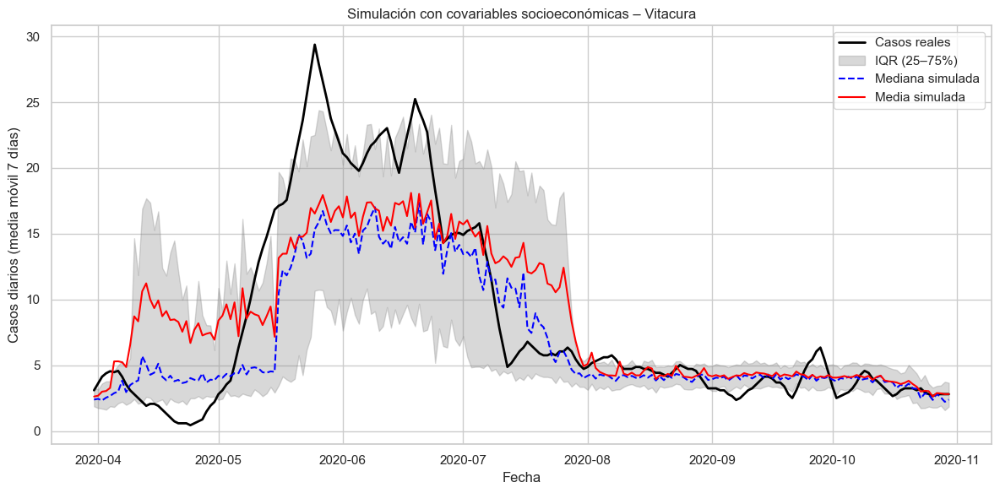

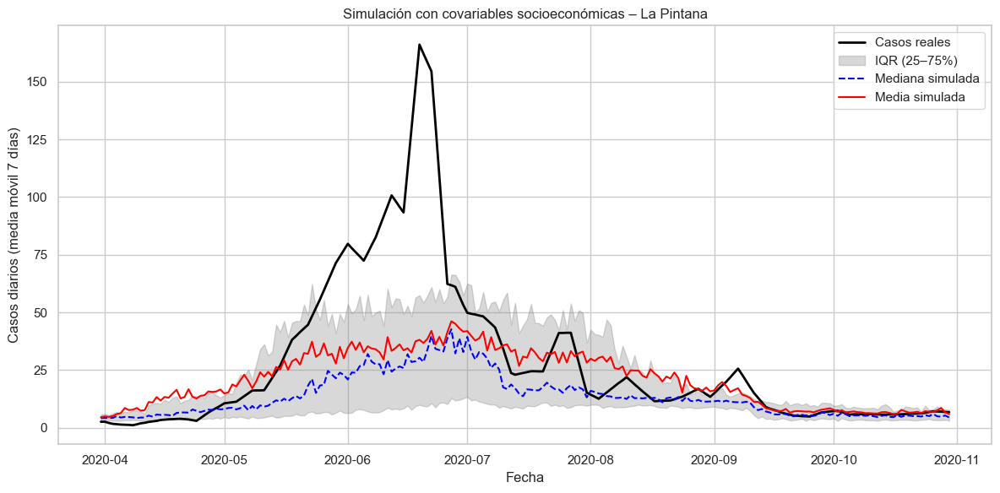

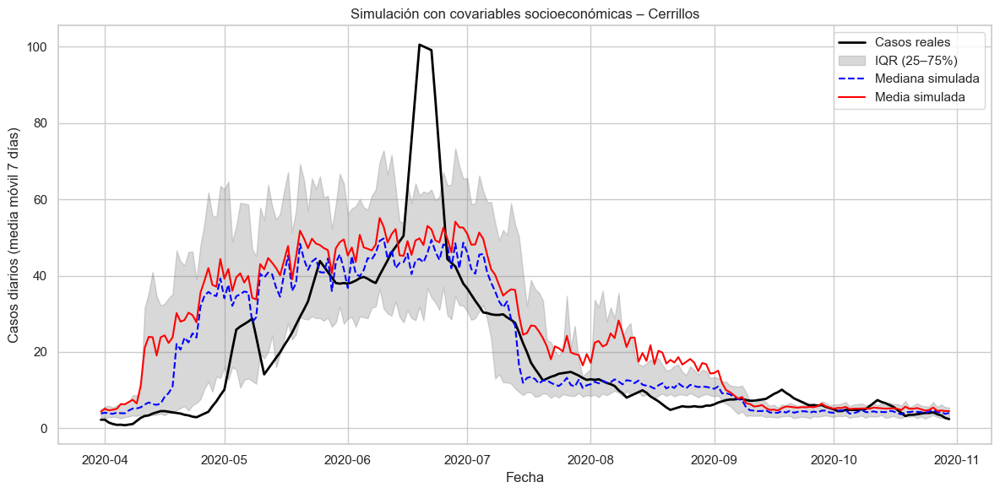

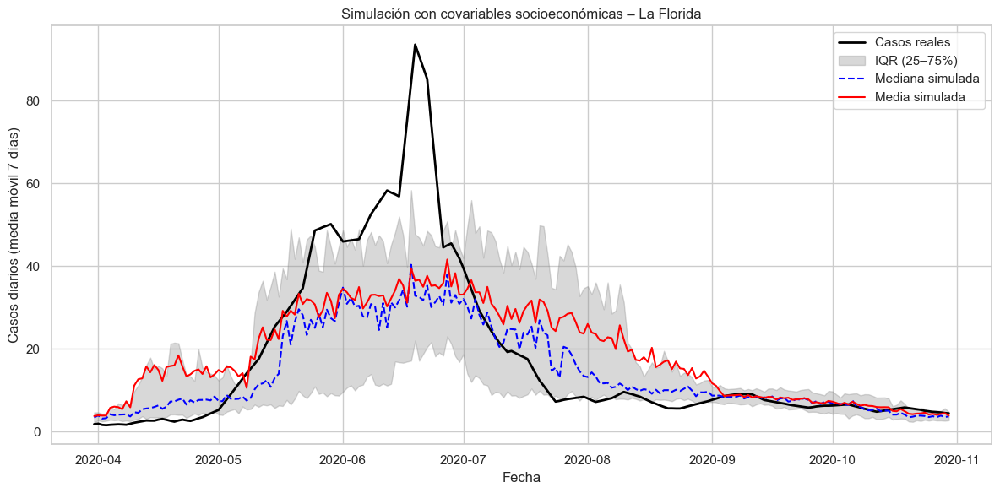

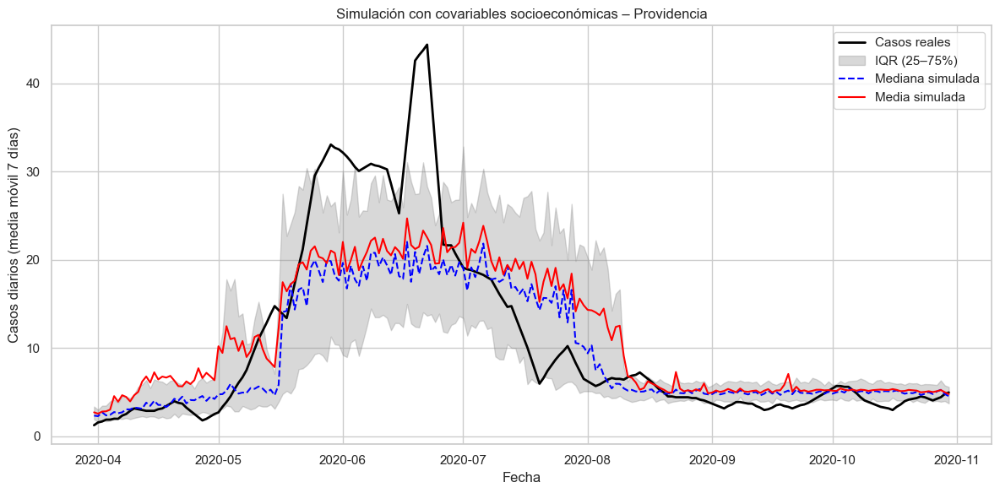

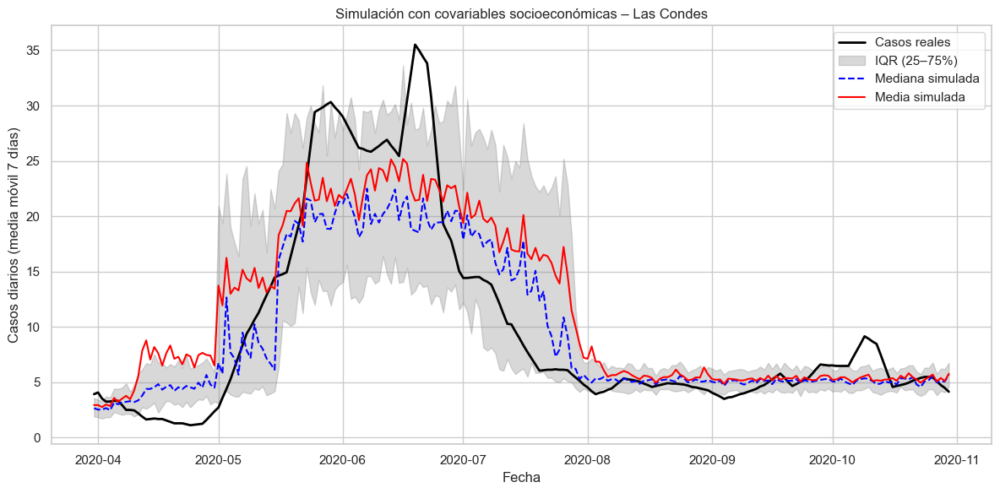

In [61]:
import matplotlib.pyplot as plt
import numpy as np

target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data[covid_data["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Simulaciones del modelo mejorado
    df_sim = sim_df_soc[sim_df_soc["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación con covariables socioeconómicas – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Simulación del modelo con 5 estados

In [62]:
from rpy2.robjects import Formula

# Emisión sin covariables (como al principio)
hmm_formula_base5 = Formula("boxcox_cases ~ 1")

# Transición con movilidad y comuna
trans_formula_base5 = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")


In [63]:
gaussian_family = r["gaussian"]()

# Crear el modelo con 5 estados
hmm_model_base5 = depmixS4.depmix(
    response=hmm_formula_base5,
    data=r["covid_data_r"],
    nstates=5,
    family=gaussian_family,
    transition=trans_formula_base5,
    ntimes=r["ntimes"]
)

# Ajustar el modelo
hmm_fitted_base5 = depmixS4.fit(hmm_model_base5, verbose=False)

# Guardar en R para simulaciones
r.assign("hmm_fitted_base5", hmm_fitted_base5)


converged at iteration 55 with logLik: -1544.795 


<rpy2.robjects.methods.RS4 object at 0x177cf27c0> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [64]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_base5 <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_base5)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_base5[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)  # Inversa de Box-Cox
}}
sim_df_base5 <- as.data.frame(do.call(cbind, simulaciones_list_base5))
colnames(sim_df_base5) <- paste0("sim_", 1:{N_sim})
sim_df_base5$Commune <- covid_data_r$Commune
sim_df_base5$Date <- as.character(covid_data_r$Date)
''')


In [65]:
# Convertir desde R a pandas
sim_df_base5 = pandas2ri.rpy2py(r['sim_df_base5'])

# Asegurar formato de fecha correcto
sim_df_base5['Date'] = pd.to_datetime(sim_df_base5['Date'])

# Vista previa
print(sim_df_base5.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  4.698688  2.100019  3.149242  3.198370  1.582184  4.254525  2.370029   
2  2.034421  2.061943  1.482868  1.775078  3.404398  2.369612  1.352325   
3  3.925209  2.527039  4.071866  6.971849  2.722165  5.630978  2.326239   
4  3.263337  2.912166  3.712938  3.653058  1.909552  1.371865  1.652700   
5  2.024138  3.456336  1.976817  2.548079  8.243159  1.452051  2.933380   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95    sim_96  \
1  1.942615  1.414391  2.927369  ...  3.775422  2.471579  1.596388  3.228500   
2  2.837890  4.375716  3.022705  ...  1.286621  1.667466  3.397164  3.463874   
3  3.583061  2.814920  2.857557  ...  1.369870  2.326738  3.176851  2.288884   
4  2.933928  2.242094  1.857921  ...  2.709640  3.460054  5.937627  2.623660   
5  2.891141  3.519089  2.819196  ...  2.287430  1.842069  2.646638  1.535613   

     sim_97    sim_98    sim_99   sim_100    Commune       Date  
1 

In [66]:
from sklearn.metrics import mean_squared_error

rmse_base5 = {}
comunas_unicas = covid_data['Commune'].unique()

for comuna in comunas_unicas:
    df_real = covid_data[covid_data['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_base5[sim_df_base5['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_base5[comuna] = rmse

# Convertir a DataFrame
rmse_df_base5 = pd.DataFrame(list(rmse_base5.items()), columns=['Commune', 'RMSE'])
rmse_df_base5 = rmse_df_base5.sort_values('RMSE', ascending=False)

# Mostrar
print("🔴 Comunas con mayor error (modelo base, 5 estados):")
print(rmse_df_base5.head(10))

print("\n🟢 Comunas con menor error (modelo base, 5 estados):")
print(rmse_df_base5.tail(10))


🔴 Comunas con mayor error (modelo base, 5 estados):
          Commune       RMSE
31      San Ramon  36.164937
9       La Granja  34.067019
22       Pudahuel  24.968393
10     La Pintana  23.263397
1     Cerro Navia  22.758763
7     La Cisterna  22.343990
15       Lo Prado  22.058742
27          Renca  21.790635
25  Quinta Normal  20.875988
2        Conchali  20.552933

🟢 Comunas con menor error (modelo base, 5 estados):
         Commune       RMSE
16         Macul  11.194790
8     La Florida  10.463074
17         Maipu   8.657657
13  Lo Barnechea   7.397810
18         Nunoa   6.424033
32      Santiago   5.555088
33      Vitacura   5.245063
11      La Reina   5.184957
12    Las Condes   4.967821
21   Providencia   3.891263


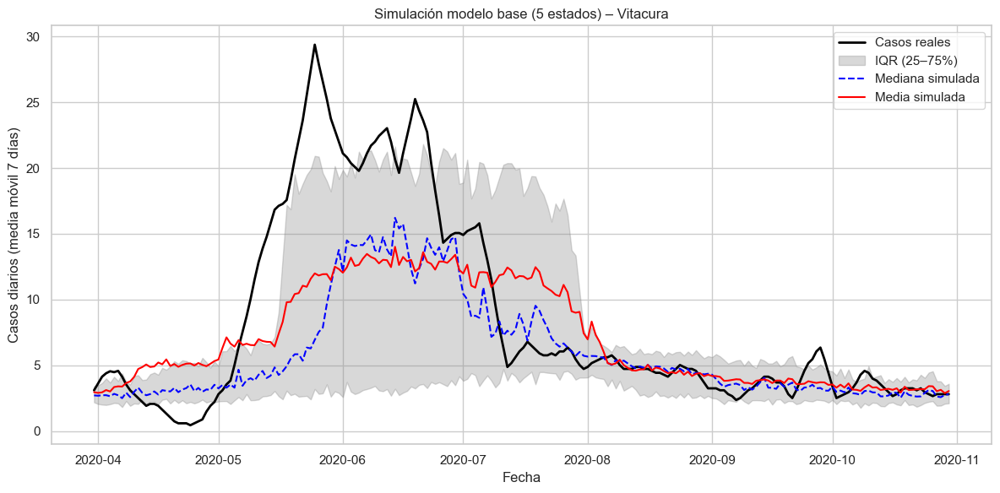

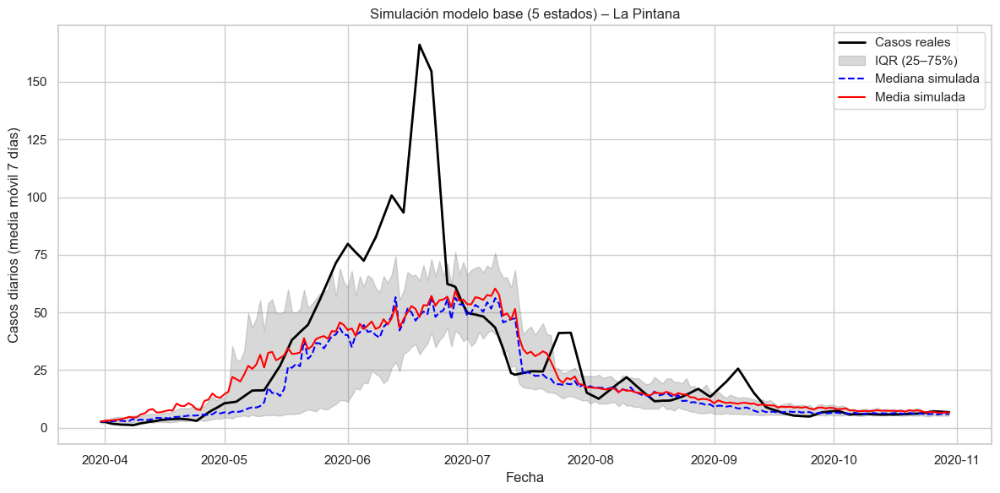

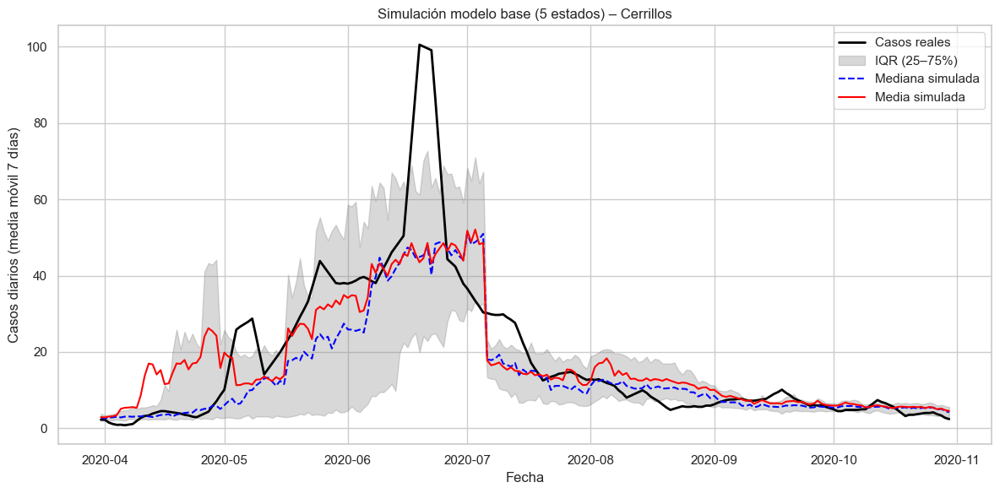

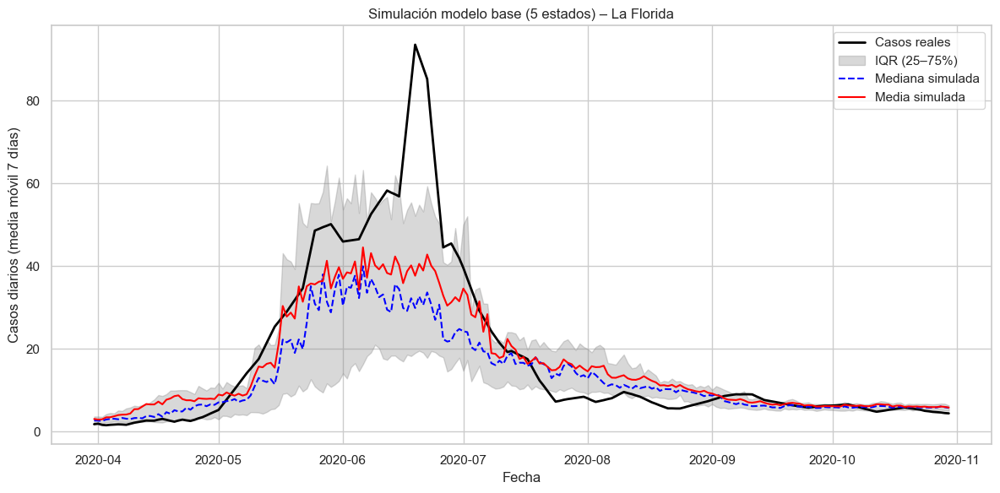

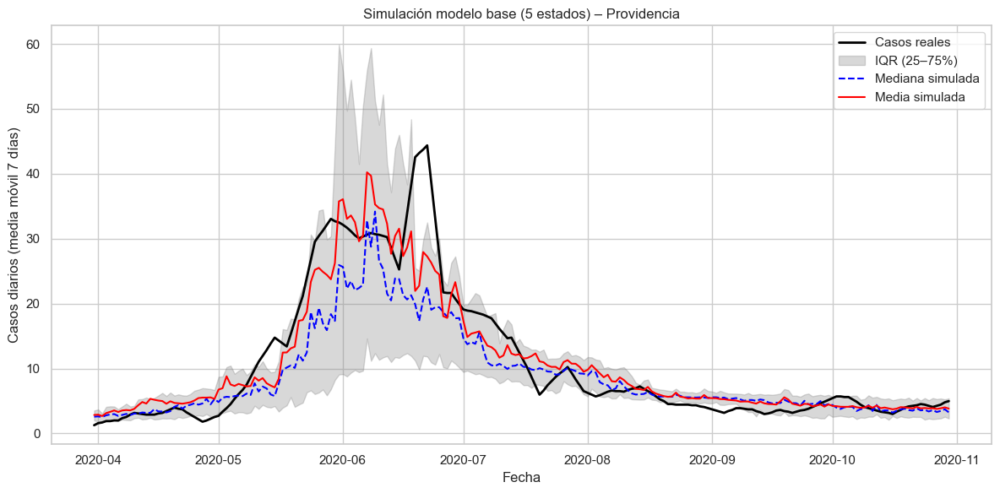

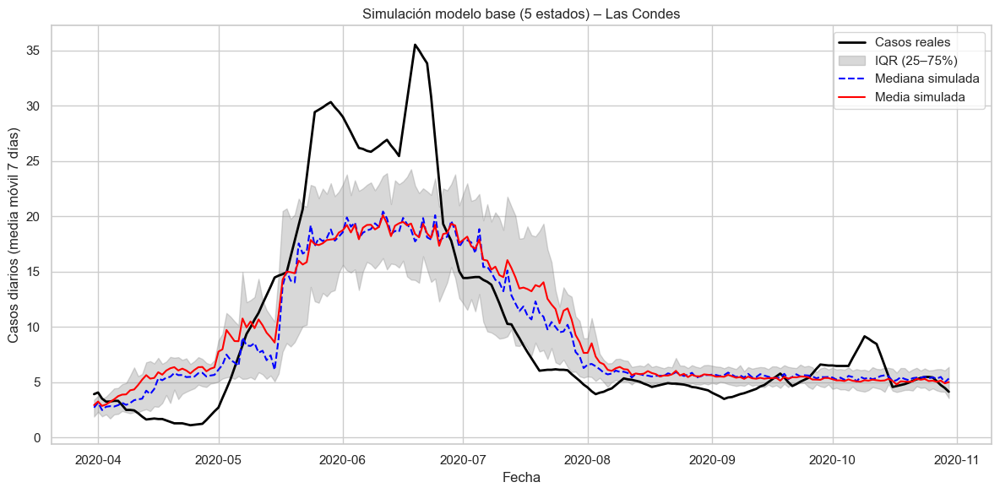

In [67]:
import matplotlib.pyplot as plt
import numpy as np

target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data[covid_data["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Simulaciones del modelo base 5 estados
    df_sim = sim_df_base5[sim_df_base5["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación modelo base (5 estados) – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Prueba Simulación 3 Estados con Covariable Calidad Urbana

In [68]:
from rpy2.robjects import Formula

# Fórmula de emisión con solo Urban Quality of Life Index
hmm_formula_uqli = Formula("boxcox_cases ~ Urban_Quality_of_Life_Index_2024")

# Fórmula de transición (como siempre)
trans_formula_uqli = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")


In [69]:
# Crear el modelo con 3 estados
gaussian_family = r["gaussian"]()

hmm_model_uqli = depmixS4.depmix(
    response=hmm_formula_uqli,
    data=r["covid_data_r"],
    nstates=3,
    family=gaussian_family,
    transition=trans_formula_uqli,
    ntimes=r["ntimes"]
)

# Ajustar el modelo
hmm_fitted_uqli = depmixS4.fit(hmm_model_uqli, verbose=False)

# Guardar en entorno de R para simulación
r.assign("hmm_fitted_uqli", hmm_fitted_uqli)


converged at iteration 77 with logLik: -4397.023 


<rpy2.robjects.methods.RS4 object at 0x3091e6ac0> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [70]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_uqli <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_uqli)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_uqli[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)  # Inversa Box-Cox
}}
sim_df_uqli <- as.data.frame(do.call(cbind, simulaciones_list_uqli))
colnames(sim_df_uqli) <- paste0("sim_", 1:{N_sim})
sim_df_uqli$Commune <- covid_data_r$Commune
sim_df_uqli$Date <- as.character(covid_data_r$Date)
''')


In [71]:
# Convertir desde R a pandas
sim_df_uqli = pandas2ri.rpy2py(r['sim_df_uqli'])

# Asegurar que la columna 'Date' tenga el tipo correcto
sim_df_uqli['Date'] = pd.to_datetime(sim_df_uqli['Date'])

# Vista previa
print(sim_df_uqli.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  2.847158  9.856263  2.260578  1.850568  2.999122  2.904672  3.804645   
2  3.360074  5.753897  5.377815  1.924250  4.622461  4.884234  2.273179   
3  4.011302  6.169265  1.750748  4.384649  2.798810  5.665832  4.268555   
4  2.533939  6.044230  0.967254  4.340073  2.419445  1.994723  3.489484   
5  8.052283  5.937733  4.206540  5.280944  3.366972  2.123562  2.430179   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95    sim_96  \
1  1.769187  3.482680  1.605993  ...  2.878816  1.305018  3.925265  2.645990   
2  2.743619  4.042101  3.745980  ...  7.647979  6.971584  2.977065  3.284894   
3  4.476701  4.757951  5.698077  ...  4.745230  2.732191  1.720243  2.515220   
4  4.030294  4.142539  7.753528  ...  2.326341  1.899702  4.448701  4.840635   
5  4.733667  3.107855  4.332829  ...  1.612802  3.301537  2.040148  3.170704   

     sim_97    sim_98    sim_99   sim_100    Commune       Date  
1 

In [72]:
from sklearn.metrics import mean_squared_error

rmse_uqli = {}
comunas_unicas = covid_data['Commune'].unique()

for comuna in comunas_unicas:
    df_real = covid_data[covid_data['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_uqli[sim_df_uqli['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_uqli[comuna] = rmse

# Convertir a DataFrame
rmse_df_uqli = pd.DataFrame(list(rmse_uqli.items()), columns=['Commune', 'RMSE'])
rmse_df_uqli = rmse_df_uqli.sort_values('RMSE', ascending=False)

# Mostrar
print("🔴 Comunas con mayor error (modelo UQLI):")
print(rmse_df_uqli.head(10))

print("\n🟢 Comunas con menor error (modelo UQLI):")
print(rmse_df_uqli.tail(10))


🔴 Comunas con mayor error (modelo UQLI):
          Commune       RMSE
31      San Ramon  35.711295
9       La Granja  31.146002
10     La Pintana  28.192506
15       Lo Prado  27.908653
27          Renca  25.518083
1     Cerro Navia  25.132919
29    San Joaquin  24.817455
25  Quinta Normal  24.734821
26       Recoleta  24.096833
22       Pudahuel  23.289261

🟢 Comunas con menor error (modelo UQLI):
             Commune       RMSE
0          Cerrillos  13.466193
4   Estacion Central  10.590785
17             Maipu  10.514715
32          Santiago  10.257569
13      Lo Barnechea   9.691801
18             Nunoa   8.085498
33          Vitacura   7.336687
11          La Reina   6.877786
21       Providencia   5.661723
12        Las Condes   5.110397


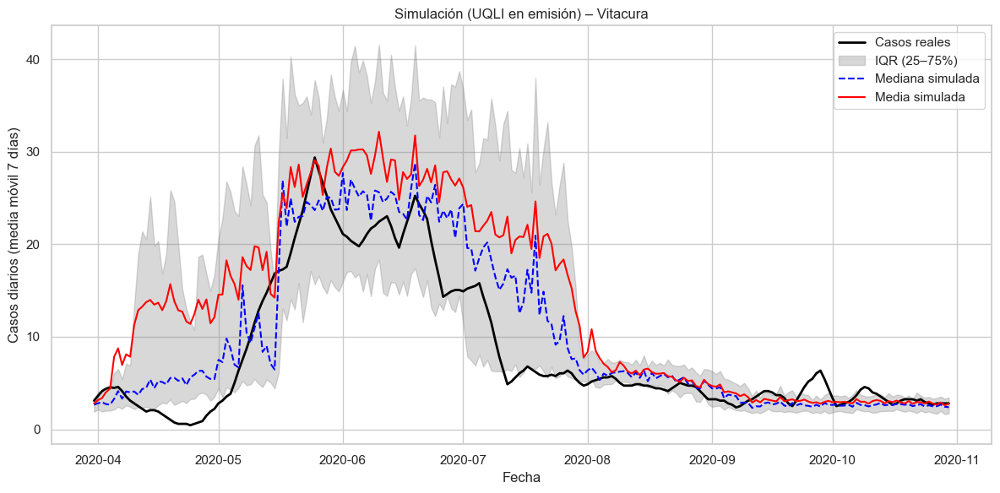

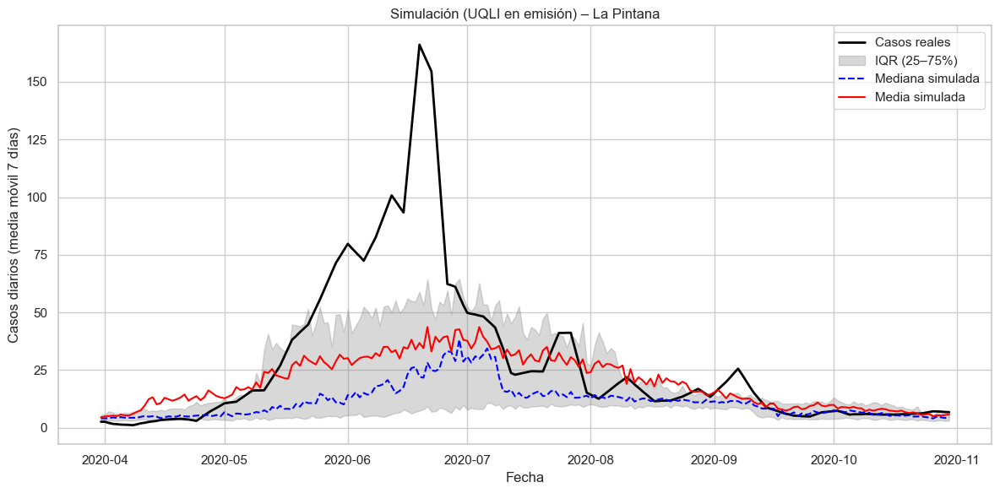

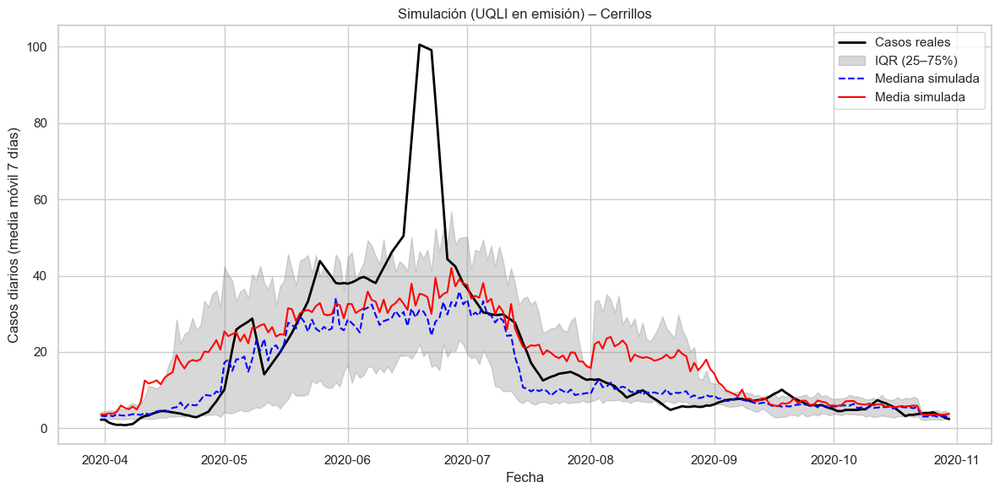

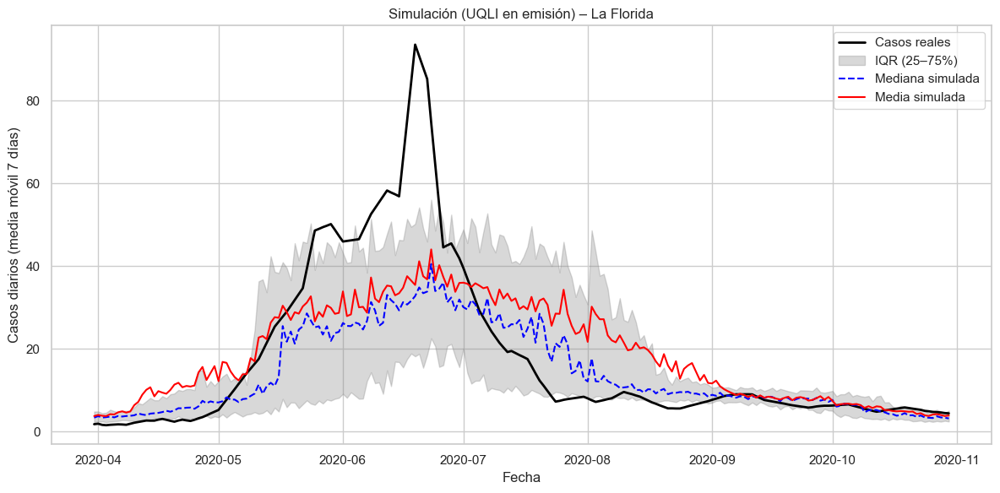

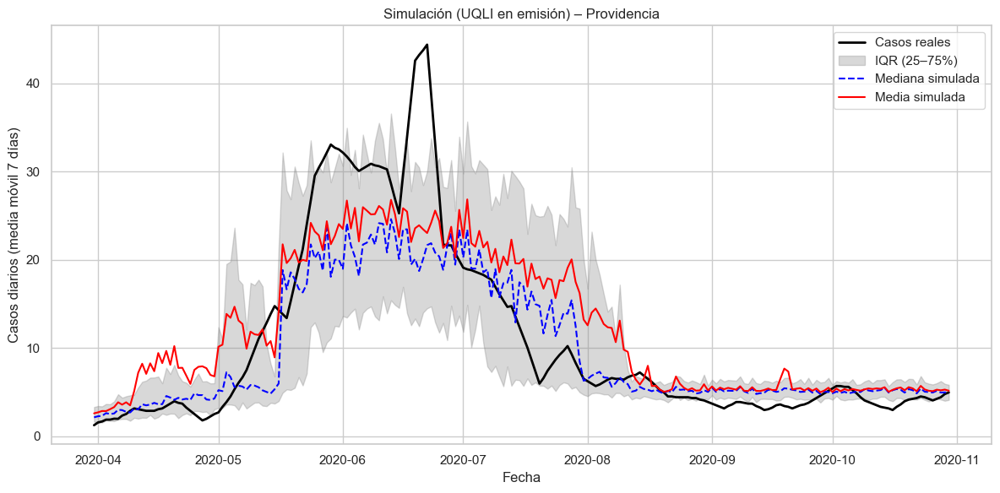

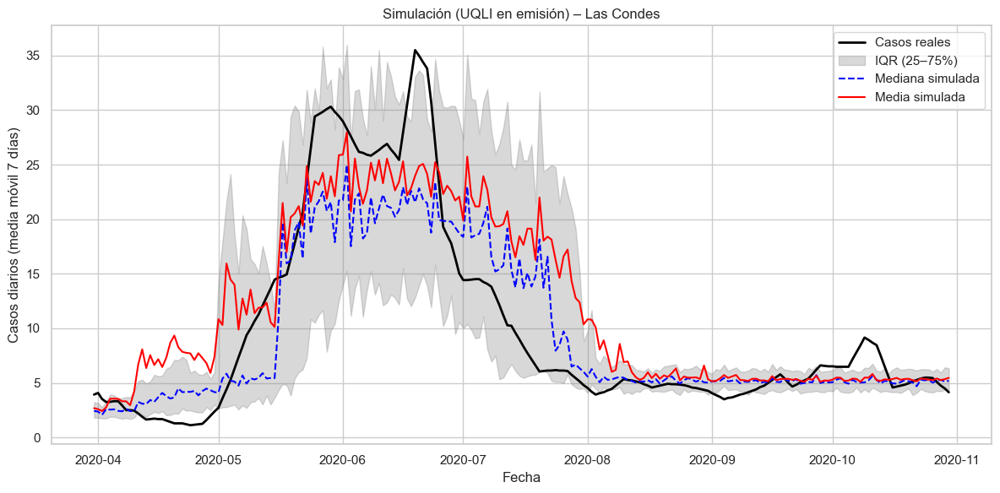

In [73]:
import matplotlib.pyplot as plt
import numpy as np

target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data[covid_data["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Simulaciones del modelo con UQLI
    df_sim = sim_df_uqli[sim_df_uqli["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación (UQLI en emisión) – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Simulación 5 estados modelo + covariable calidad urbana

In [80]:
from rpy2.robjects import Formula

# Fórmula de emisión con calidad de vida urbana
hmm_formula_uqli_5 = Formula("Gross_Daily_Cases_Mobile_Average_7_Days ~ Urban_Quality_of_Life_Index_2024")

# Fórmula de transición (igual que antes)
trans_formula_uqli_5 = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")


In [81]:
# Cargar distribución gaussiana
gaussian_family = r["gaussian"]()

# Crear el modelo HMM con 5 estados
hmm_model_uqli_5 = depmixS4.depmix(
    response=hmm_formula_uqli_5,
    data=r["covid_data_r"],
    nstates=5,
    family=gaussian_family,
    transition=trans_formula_uqli_5,
    ntimes=r["ntimes"]
)

# Ajustar el modelo
hmm_fitted_uqli_5 = depmixS4.fit(hmm_model_uqli_5, verbose=False)

# Guardar el modelo ajustado en R para usarlo después
r.assign("hmm_fitted_uqli_5", hmm_fitted_uqli_5)


converged at iteration 60 with logLik: -18857.78 


<rpy2.robjects.methods.RS4 object at 0x30e9fb740> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [82]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_uqli_5 <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_uqli_5)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_uqli_5[[i]] <- sim_vals  # SIN inversa de Box-Cox
}}
sim_df_uqli_5 <- as.data.frame(do.call(cbind, simulaciones_list_uqli_5))
colnames(sim_df_uqli_5) <- paste0("sim_", 1:{N_sim})
sim_df_uqli_5$Commune <- covid_data_r$Commune
sim_df_uqli_5$Date <- as.character(covid_data_r$Date)
''')



In [83]:
# Convertir desde R a pandas
sim_df_uqli_5 = pandas2ri.rpy2py(r['sim_df_uqli_5'])

# Asegurar que la columna 'Date' tenga el tipo correcto
sim_df_uqli_5['Date'] = pd.to_datetime(sim_df_uqli_5['Date'])

# Vista previa
print(sim_df_uqli_5.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  1.982347  3.299575  3.322687  2.311538  4.334132  3.038342  4.494771   
2  3.132008  1.568376  3.991964  1.787176  3.003255  3.557560  2.966355   
3  3.785352  2.882498  0.585545  2.224927  2.008487  1.265227  2.771327   
4  3.824199  4.329123  4.040791  2.247788  3.517924  2.951215  3.435795   
5  2.150018  2.249063  2.878870  2.304660  5.367121  3.053116  2.963078   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95    sim_96  \
1  2.098138  1.907972  2.355772  ...  1.884828  3.988252  2.609876  3.411854   
2  2.145492  2.854434  3.879012  ...  1.852915  2.937650  3.313513  2.605071   
3  2.755671  3.507142  3.527618  ...  3.032678  0.946149  3.296270  2.727263   
4  2.346402  2.211852  3.101399  ...  2.212389  4.241108  4.357812  2.725155   
5  3.507567  4.609335  3.176141  ...  3.726144  2.108710  2.704414  3.596561   

     sim_97    sim_98    sim_99   sim_100    Commune       Date  
1 

In [84]:
from sklearn.metrics import mean_squared_error

rmse_uqli_5 = {}
comunas_unicas = covid_data['Commune'].unique()

for comuna in comunas_unicas:
    df_real = covid_data[covid_data['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_uqli_5[sim_df_uqli_5['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_uqli_5[comuna] = rmse

# Convertir a DataFrame
rmse_df_uqli_5 = pd.DataFrame(list(rmse_uqli_5.items()), columns=['Commune', 'RMSE'])
rmse_df_uqli_5 = rmse_df_uqli_5.sort_values('RMSE', ascending=False)

# Mostrar
print("🔴 Comunas con mayor error (modelo UQLI, 5 estados):")
print(rmse_df_uqli_5.head(10))

print("\n🟢 Comunas con menor error (modelo UQLI, 5 estados):")
print(rmse_df_uqli_5.tail(10))


🔴 Comunas con mayor error (modelo UQLI, 5 estados):
          Commune       RMSE
31      San Ramon  35.972834
9       La Granja  31.027019
15       Lo Prado  24.765687
1     Cerro Navia  22.325326
22       Pudahuel  21.807502
10     La Pintana  21.792866
7     La Cisterna  21.730373
27          Renca  21.407562
3       El Bosque  21.278510
25  Quinta Normal  20.707868

🟢 Comunas con menor error (modelo UQLI, 5 estados):
         Commune       RMSE
28  San Bernardo  12.123001
8     La Florida  10.835972
17         Maipu   9.692392
32      Santiago   7.879366
18         Nunoa   6.823667
13  Lo Barnechea   6.441838
11      La Reina   6.368377
21   Providencia   5.988183
33      Vitacura   4.742176
12    Las Condes   3.435274


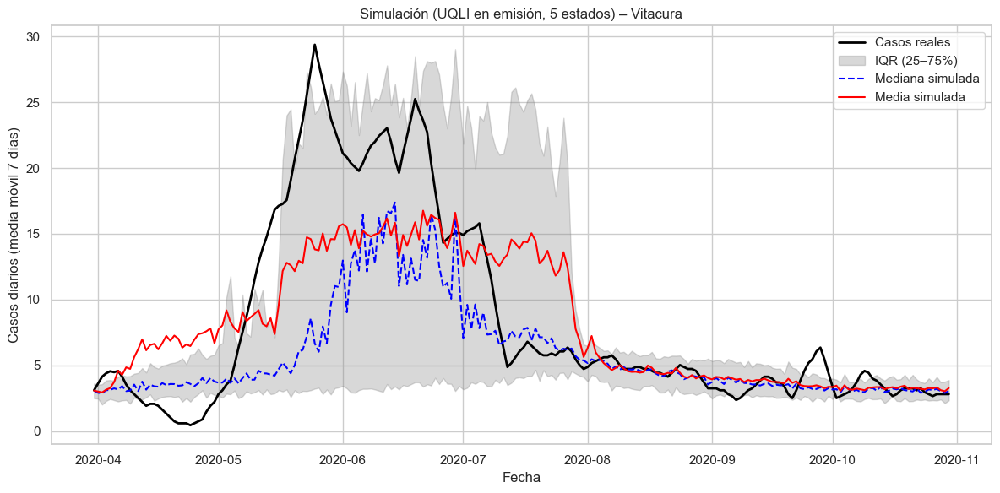

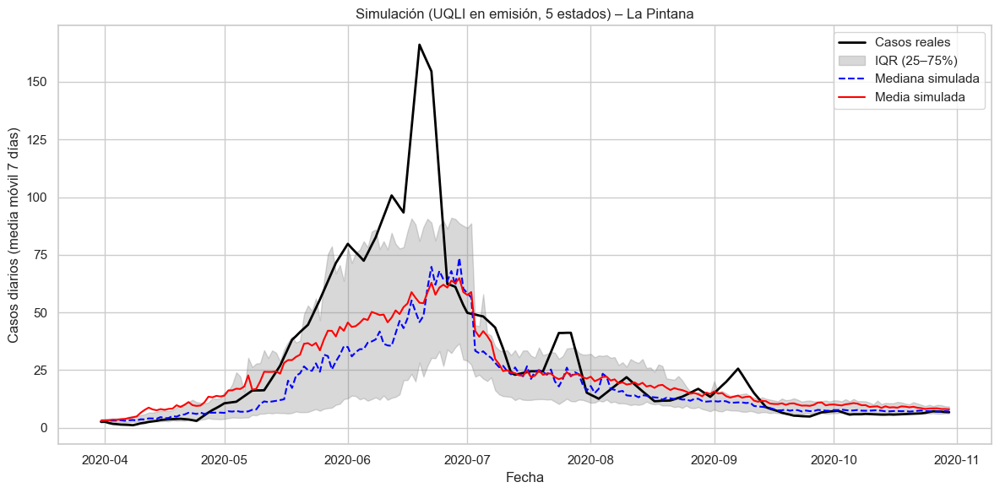

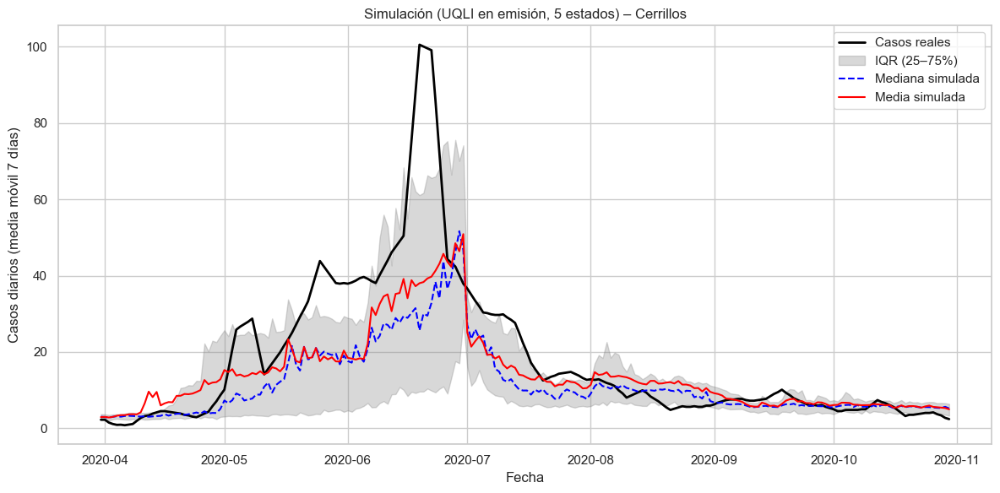

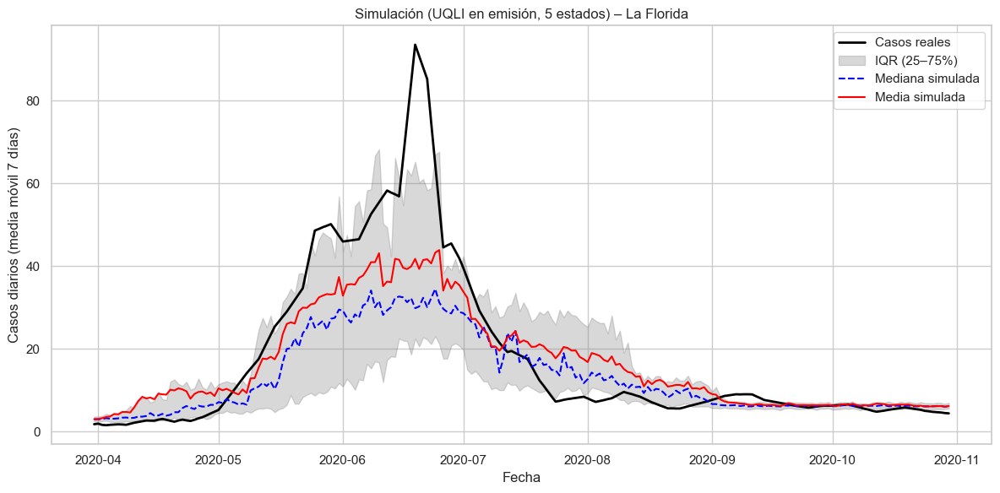

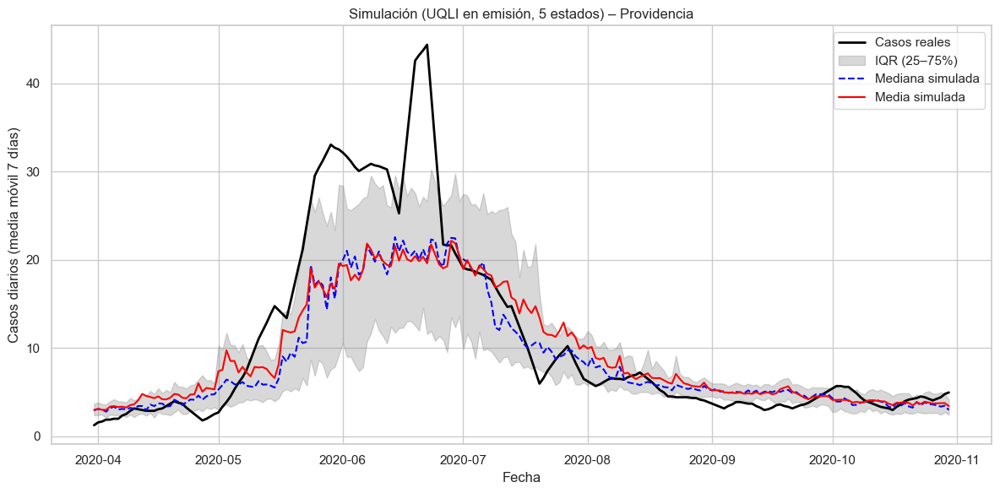

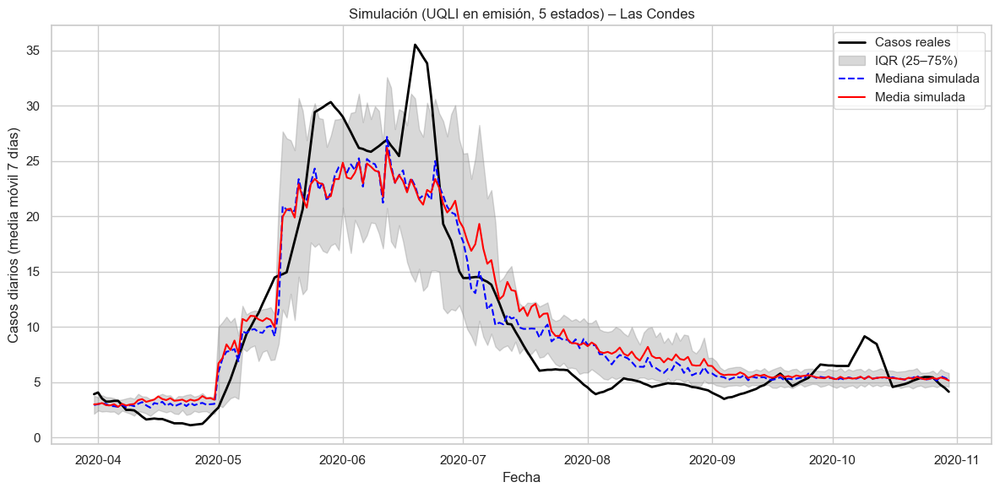

In [85]:
import matplotlib.pyplot as plt
import numpy as np

target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data[covid_data["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Simulaciones del modelo UQLI con 5 estados
    df_sim = sim_df_uqli_5[sim_df_uqli_5["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación (UQLI en emisión, 5 estados) – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Simulación 5 estados y 2 covariables: Precariedad + Ingreso Per Cápita

In [104]:
r('''
library(MASS)

lambda <- 0.01
covid_data_r$boxcox_cases <- ifelse(
  covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days > 0,
  (covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days^lambda - 1) / lambda,
  0
)
''')

In [105]:
from rpy2.robjects import Formula

# Fórmula de emisión con covariables socioeconómicas
hmm_formula_soc_5 = Formula("boxcox_cases ~ Housing_Precariousness_Index + Per_Capita_Income")

# Fórmula de transición (misma que antes)
trans_formula_soc_5 = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")


In [106]:
from rpy2.robjects import Formula

# Cargar distribución y paquete
depmixS4 = importr("depmixS4")
gaussian_family = r["gaussian"]()

# Crear modelo con 5 estados
hmm_model_soc_5 = depmixS4.depmix(
    response=hmm_formula_soc_5,
    data=r["covid_data_r"],
    nstates=5,
    family=gaussian_family,
    transition=trans_formula_soc_5,
    ntimes=r["ntimes"]
)

# Ajustar modelo
hmm_fitted_soc_5 = depmixS4.fit(hmm_model_soc_5, verbose=False)

# Exportar al entorno R para simulación
r.assign("hmm_fitted_soc_5", hmm_fitted_soc_5)


converged at iteration 75 with logLik: -1446.476 


<rpy2.robjects.methods.RS4 object at 0x30e84e740> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [107]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_soc_5 <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_soc_5)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_soc_5[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)  # Inversa de Box-Cox
}}
sim_df_soc_5 <- as.data.frame(do.call(cbind, simulaciones_list_soc_5))
colnames(sim_df_soc_5) <- paste0("sim_", 1:{N_sim})
sim_df_soc_5$Commune <- covid_data_r$Commune
sim_df_soc_5$Date <- as.character(covid_data_r$Date)
''')


In [108]:
# Convertir desde R a pandas
sim_df_soc_5 = pandas2ri.rpy2py(r['sim_df_soc_5'])

# Asegurarse de que la fecha esté en formato datetime
sim_df_soc_5['Date'] = pd.to_datetime(sim_df_soc_5['Date'])

# Vista previa
print(sim_df_soc_5.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  7.686327  3.476777  6.643392  4.177965  6.836433  2.606340  2.787496   
2  3.227401  3.472003  2.708036  2.757302  1.530281  3.037848  2.440298   
3  1.985263  2.139163  5.116867  4.452273  1.512435  3.749082  1.960570   
4  2.752438  3.815182  1.584799  2.989370  2.152283  1.538774  3.746396   
5  2.040140  2.697537  3.739745  1.415174  1.694408  1.626839  2.573703   

       sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95    sim_96  \
1   3.865522  1.066514  1.084954  ...  2.608478  2.856923  1.904615  2.666352   
2   2.744587  2.117953  1.834842  ...  0.658418  2.219833  3.746371  4.003844   
3   2.668752  2.172052  1.927514  ...  2.213306  2.192364  2.640848  2.265422   
4   4.364570  1.793451  1.134714  ...  1.595131  3.215619  3.401323  2.681214   
5  11.190728  8.365269  5.966719  ...  2.302603  2.839075  2.448218  2.454498   

     sim_97    sim_98    sim_99   sim_100    Commune       Dat

In [109]:
from sklearn.metrics import mean_squared_error

comunas_unicas = covid_data['Commune'].unique()
rmse_soc_5 = {}

for comuna in comunas_unicas:
    df_real = covid_data[covid_data['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_soc_5[sim_df_soc_5['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_soc_5[comuna] = rmse

# Convertir a DataFrame
rmse_df_soc_5 = pd.DataFrame(list(rmse_soc_5.items()), columns=['Commune', 'RMSE'])
rmse_df_soc_5 = rmse_df_soc_5.sort_values('RMSE', ascending=False)

# Mostrar comparación
print("🔴 Comunas con mayor error (modelo soc 5 estados):")
print(rmse_df_soc_5.head(10))

print("\n🟢 Comunas con menor error (modelo soc 5 estados):")
print(rmse_df_soc_5.tail(10))


🔴 Comunas con mayor error (modelo soc 5 estados):
          Commune       RMSE
31      San Ramon  36.335947
9       La Granja  30.344834
10     La Pintana  22.977273
25  Quinta Normal  22.602235
15       Lo Prado  22.335186
27          Renca  22.208293
22       Pudahuel  21.924264
7     La Cisterna  21.474404
2        Conchali  20.996180
1     Cerro Navia  20.853646

🟢 Comunas con menor error (modelo soc 5 estados):
          Commune       RMSE
16          Macul  11.996173
0       Cerrillos  11.974133
6   Independencia  11.943633
8      La Florida  11.858524
11       La Reina   9.475648
21    Providencia   8.247563
32       Santiago   7.689901
33       Vitacura   6.149901
13   Lo Barnechea   5.805549
12     Las Condes   5.754035


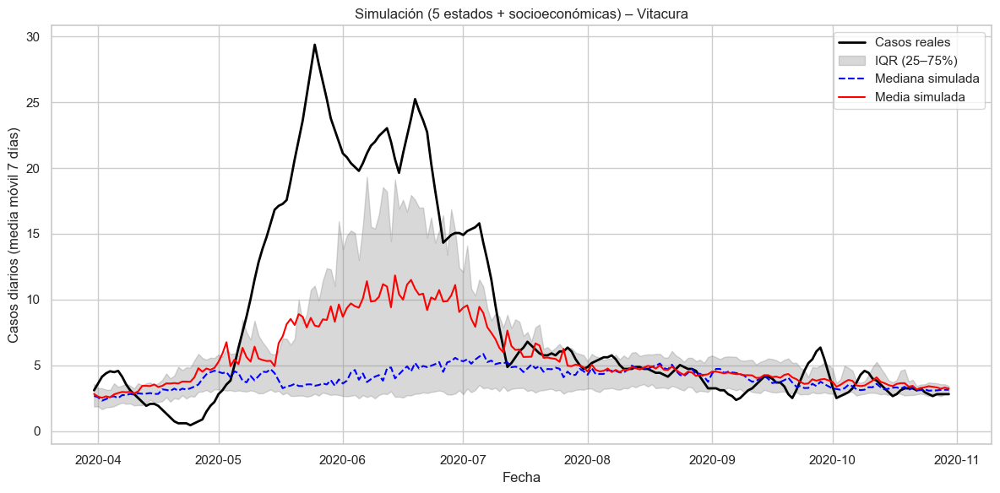

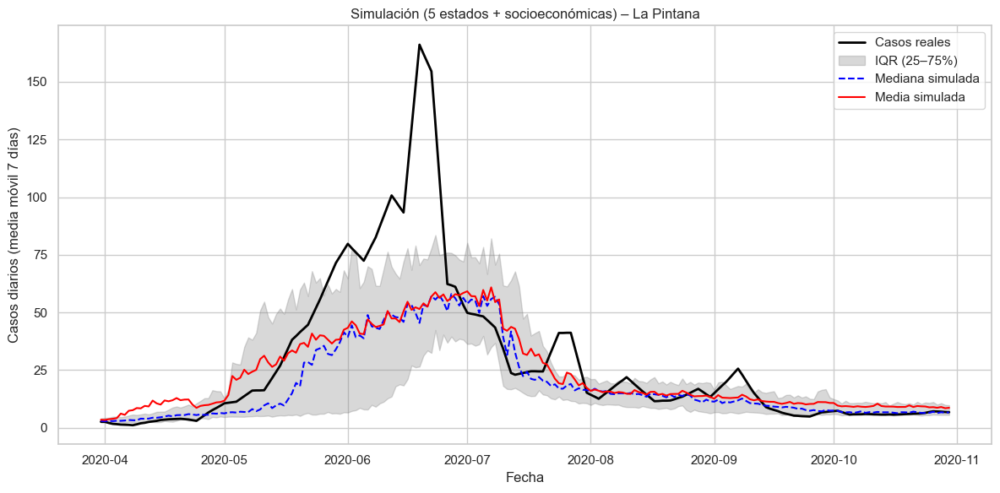

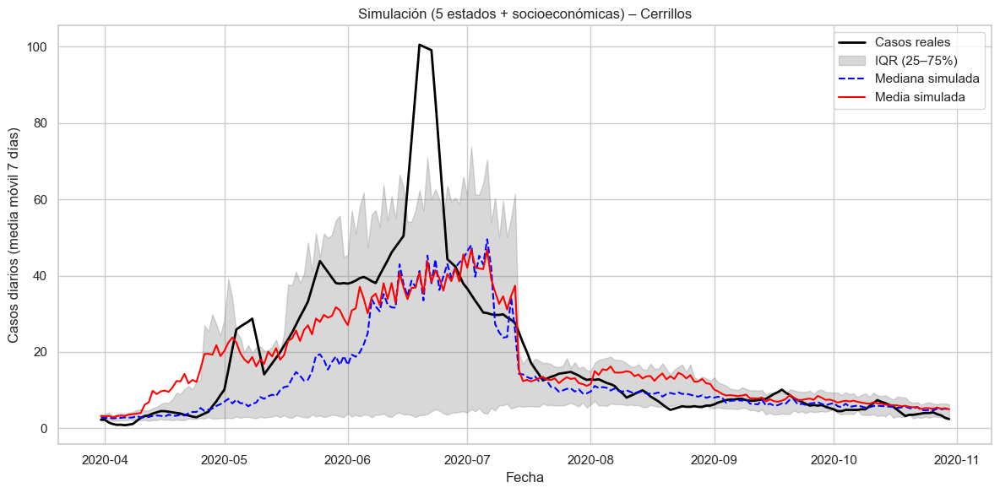

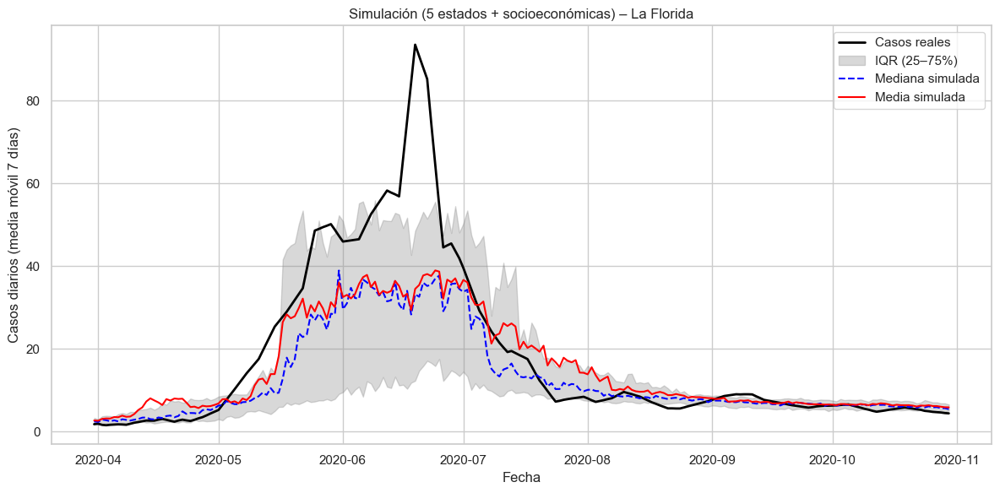

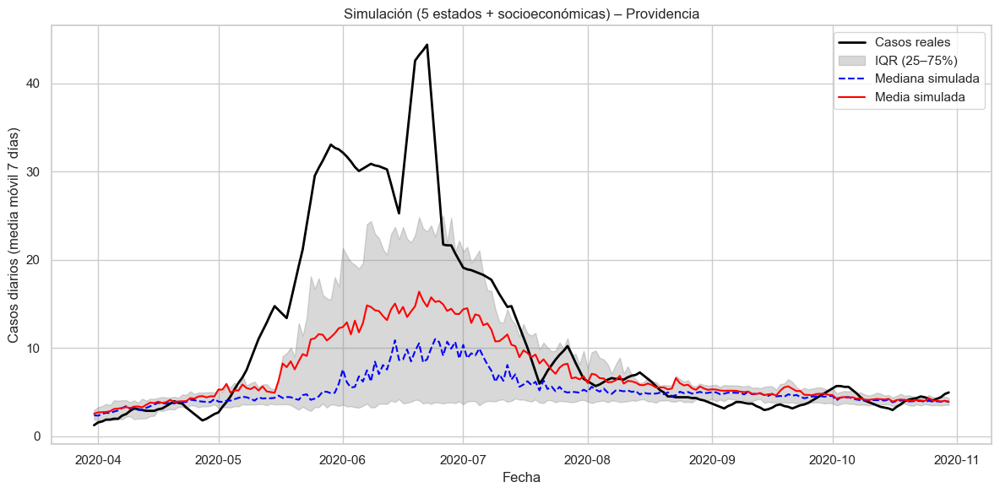

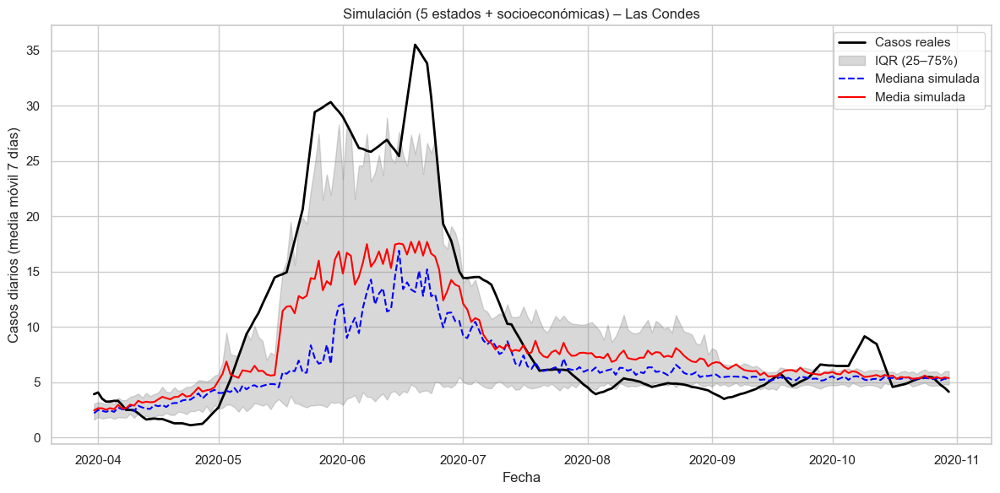

In [110]:
import matplotlib.pyplot as plt
import numpy as np

target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data[covid_data["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Simulaciones del modelo con 5 estados + covariables socioeconómicas
    df_sim = sim_df_soc_5[sim_df_soc_5["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación (5 estados + socioeconómicas) – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


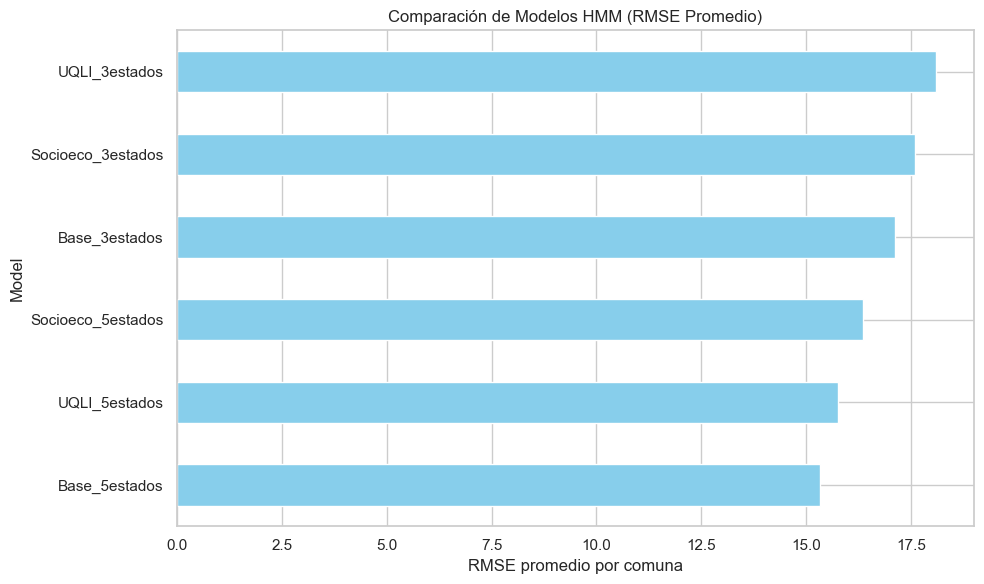

RMSE promedio por modelo:
Model
Base_5estados        15.325082
UQLI_5estados        15.753032
Socioeco_5estados    16.352033
Base_3estados        17.109773
Socioeco_3estados    17.594214
UQLI_3estados        18.099323
Name: RMSE, dtype: float64


In [118]:
# Añadir etiquetas a cada DataFrame según su modelo
rmse_df['Model'] = 'Base_3estados'
rmse_df_soc['Model'] = 'Socioeco_3estados'
rmse_df_base5['Model'] = 'Base_5estados'
rmse_df_uqli['Model'] = 'UQLI_3estados'
rmse_df_uqli_5['Model'] = 'UQLI_5estados'
rmse_df_soc_5['Model'] = 'Socioeco_5estados'

# Combinar todos
rmse_all = pd.concat([
    rmse_df,
    rmse_df_soc,
    rmse_df_base5,
    rmse_df_uqli,
    rmse_df_uqli_5,
    rmse_df_soc_5
], ignore_index=True)

# Calcular promedio por modelo
rmse_summary = rmse_all.groupby('Model')['RMSE'].mean().sort_values()

# Graficar
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
rmse_summary.plot(kind='barh', color='skyblue')
plt.xlabel('RMSE promedio por comuna')
plt.title('Comparación de Modelos HMM (RMSE Promedio)')
plt.grid(True)
plt.tight_layout()
plt.show()

# Mostrar tabla
print("RMSE promedio por modelo:")
print(rmse_summary)


## Data hasta el 30 de Junio

### Simulación 3 estados data hasta junio

In [147]:
# Asegurar tipo datetime
covid_data['Date'] = pd.to_datetime(covid_data['Date'])

# Filtrar hasta 30 de junio
covid_data_junio = covid_data[covid_data['Date'] <= '2020-06-30'].copy()

# ntimes para depmixS4 (debe ser un vector entero)
from rpy2.robjects.vectors import IntVector
ntimes_junio = IntVector(covid_data_junio.groupby("Commune")["Days"].count().tolist())


In [148]:
from rpy2.robjects import pandas2ri
pandas2ri.activate()

r.assign("covid_data_junio_r", pandas2ri.py2rpy(covid_data_junio))
r.assign("ntimes_junio", ntimes_junio)

r('''
library(depmixS4)
library(MASS)

lambda <- 0.01
covid_data_junio_r$boxcox_cases <- ifelse(
  covid_data_junio_r$Gross_Daily_Cases_Mobile_Average_7_Days > 0,
  (covid_data_junio_r$Gross_Daily_Cases_Mobile_Average_7_Days^lambda - 1) / lambda,
  0
)
''')


In [149]:
from rpy2.robjects import Formula
depmixS4 = importr("depmixS4")
gaussian_family = r["gaussian"]()

# Fórmulas
hmm_formula_junio = Formula("boxcox_cases ~ 1")
trans_formula_junio = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")

# Crear y ajustar
hmm_model_junio = depmixS4.depmix(
    response=hmm_formula_junio,
    data=r["covid_data_junio_r"],
    nstates=3,
    family=gaussian_family,
    transition=trans_formula_junio,
    ntimes=r["ntimes_junio"]
)
hmm_fitted_junio = depmixS4.fit(hmm_model_junio, verbose=False)
r.assign("hmm_fitted_junio", hmm_fitted_junio)


converged at iteration 182 with logLik: -2116.717 


<rpy2.robjects.methods.RS4 object at 0x177c84900> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [150]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_junio <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_junio)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_junio[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)
}}
sim_df_junio <- as.data.frame(do.call(cbind, simulaciones_list_junio))
colnames(sim_df_junio) <- paste0("sim_", 1:{N_sim})
sim_df_junio$Commune <- covid_data_junio_r$Commune
sim_df_junio$Date <- as.character(covid_data_junio_r$Date)
''')


In [151]:
sim_df_junio = pandas2ri.rpy2py(r['sim_df_junio'])
sim_df_junio['Date'] = pd.to_datetime(sim_df_junio['Date'])


In [152]:
from sklearn.metrics import mean_squared_error

comunas_unicas = covid_data_junio['Commune'].unique()
rmse_junio = {}

for comuna in comunas_unicas:
    df_real = covid_data_junio[covid_data_junio['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_junio[sim_df_junio['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_junio[comuna] = rmse

# Convertir a DataFrame y ordenar
rmse_df_junio = pd.DataFrame(list(rmse_junio.items()), columns=['Commune', 'RMSE'])
rmse_df_junio = rmse_df_junio.sort_values('RMSE', ascending=False)

# Mostrar resultados
print("🔴 Comunas con mayor error (junio):")
print(rmse_df_junio.head(10))

print("\n🟢 Comunas con menor error (junio):")
print(rmse_df_junio.tail(10))


🔴 Comunas con mayor error (junio):
                Commune       RMSE
10           La Pintana  41.444078
15             Lo Prado  37.884333
9             La Granja  32.264594
27                Renca  31.641663
31            San Ramon  30.503224
1           Cerro Navia  30.008491
26             Recoleta  28.311861
25        Quinta Normal  26.619827
22             Pudahuel  26.564196
19  Pedro Aguirre Cerda  24.717546

🟢 Comunas con menor error (junio):
             Commune       RMSE
16             Macul  14.956647
7        La Cisterna  14.736920
8         La Florida  12.534669
4   Estacion Central  12.053647
11          La Reina  10.054198
21       Providencia   7.267743
33          Vitacura   6.315964
32          Santiago   5.912248
18             Nunoa   5.911925
12        Las Condes   3.702501


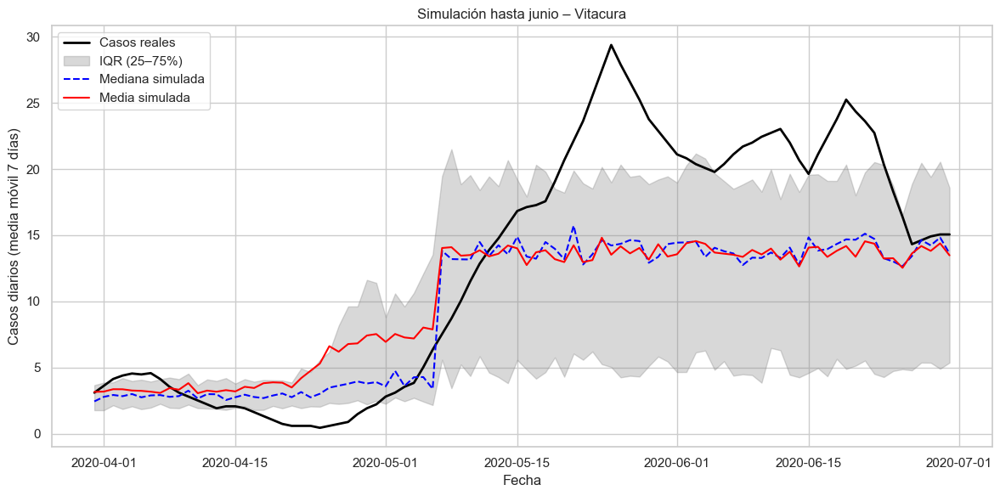

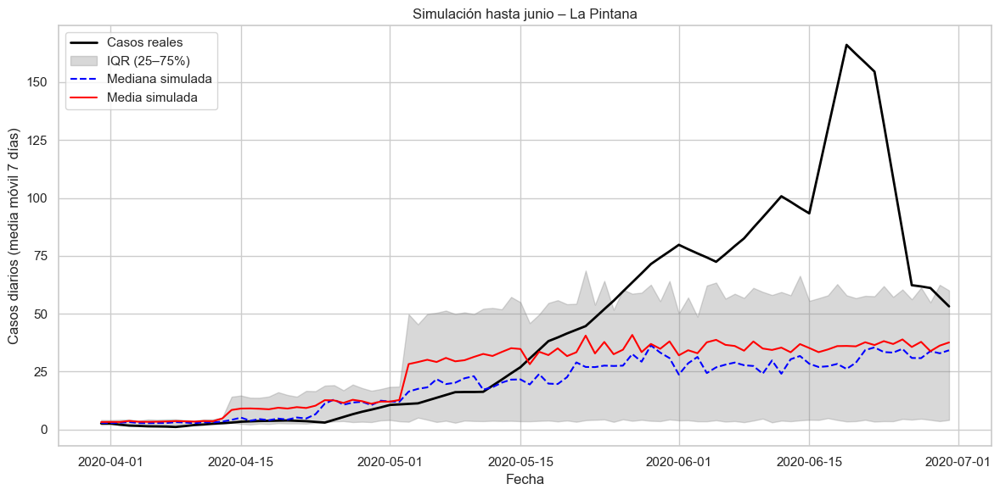

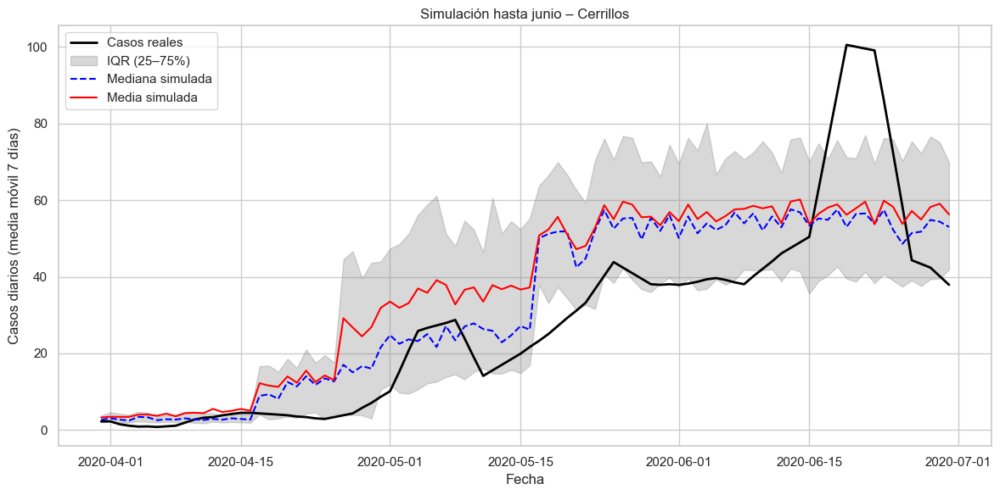

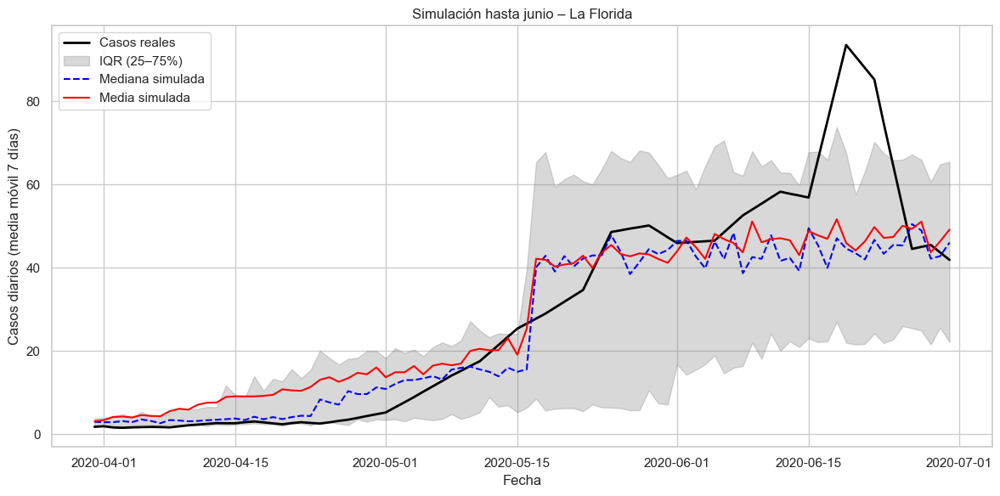

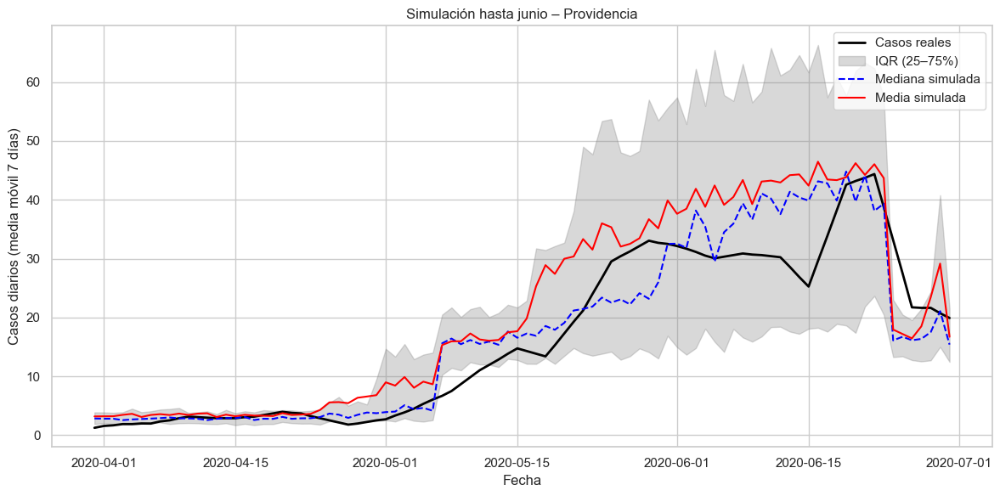

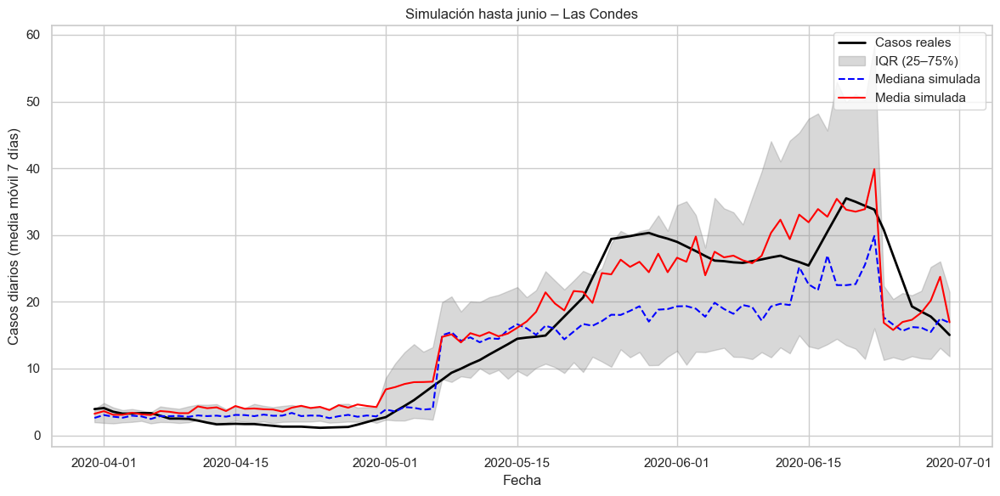

In [153]:
import matplotlib.pyplot as plt
import numpy as np

target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data_junio[covid_data_junio["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Datos simulados
    df_sim = sim_df_junio[sim_df_junio["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación hasta junio – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Simulación 5 estados data hasta junio

In [154]:
# Fórmulas
from rpy2.robjects import Formula

hmm_formula_junio_5 = Formula("boxcox_cases ~ 1")
trans_formula_junio_5 = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")
gaussian_family = r["gaussian"]()

# Crear modelo HMM con 5 estados
hmm_model_junio_5 = depmixS4.depmix(
    response=hmm_formula_junio_5,
    data=r["covid_data_junio_r"],
    nstates=5,
    family=gaussian_family,
    transition=trans_formula_junio_5,
    ntimes=r["ntimes_junio"]
)

# Ajustar el modelo
hmm_fitted_junio_5 = depmixS4.fit(hmm_model_junio_5, verbose=False)

# Guardar en R para simular
r.assign("hmm_fitted_junio_5", hmm_fitted_junio_5)


converged at iteration 72 with logLik: -1136.26 


<rpy2.robjects.methods.RS4 object at 0x30efccb40> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [155]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_junio_5 <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_junio_5)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_junio_5[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)
}}
sim_df_junio_5 <- as.data.frame(do.call(cbind, simulaciones_list_junio_5))
colnames(sim_df_junio_5) <- paste0("sim_", 1:{N_sim})
sim_df_junio_5$Commune <- covid_data_junio_r$Commune
sim_df_junio_5$Date <- as.character(covid_data_junio_r$Date)
''')


In [156]:
# Convertir desde R a pandas
sim_df_junio_5 = pandas2ri.rpy2py(r['sim_df_junio_5'])

# Asegurar tipo datetime en la columna Date
sim_df_junio_5['Date'] = pd.to_datetime(sim_df_junio_5['Date'])

# Vista previa
print(sim_df_junio_5.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  3.866578  7.760434  1.303290  1.944437  2.147902  2.518048  2.627246   
2  4.084337  2.873409  3.610766  3.577782  2.839985  2.005190  3.630495   
3  4.202799  1.590738  3.436565  3.788937  3.850217  2.154266  2.558554   
4  2.044984  3.555216  0.730187  2.319939  2.063143  4.532531  2.171405   
5  1.649868  2.505226  1.609603  4.230514  2.363632  0.808162  6.002223   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95    sim_96  \
1  2.749581  2.969091  2.298640  ...  1.189086  3.123327  1.071194  1.890936   
2  1.803647  2.972002  2.979770  ...  1.036699  1.400992  3.162180  1.290043   
3  1.569494  3.356044  2.471311  ...  1.295780  1.102956  4.675252  4.988329   
4  6.939993  2.200923  6.439544  ...  2.847530  2.038080  2.583855  4.914181   
5  4.127815  2.644829  6.370829  ...  2.056269  1.132893  1.732562  3.312093   

     sim_97    sim_98    sim_99   sim_100    Commune       Date  
1 

In [157]:
from sklearn.metrics import mean_squared_error

rmse_junio_5 = {}
comunas_unicas = covid_data_junio['Commune'].unique()

for comuna in comunas_unicas:
    df_real = covid_data_junio[covid_data_junio['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_junio_5[sim_df_junio_5['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_junio_5[comuna] = rmse

# Convertir a DataFrame
rmse_df_junio_5 = pd.DataFrame(list(rmse_junio_5.items()), columns=['Commune', 'RMSE'])
rmse_df_junio_5 = rmse_df_junio_5.sort_values('RMSE', ascending=False)

# Mostrar resultados
print("🔴 Comunas con mayor error (junio, 5 estados):")
print(rmse_df_junio_5.head(10))

print("\n🟢 Comunas con menor error (junio, 5 estados):")
print(rmse_df_junio_5.tail(10))


🔴 Comunas con mayor error (junio, 5 estados):
          Commune       RMSE
10     La Pintana  32.910681
15       Lo Prado  31.152237
31      San Ramon  28.310784
1     Cerro Navia  27.781256
27          Renca  26.856459
9       La Granja  26.526887
25  Quinta Normal  24.123312
26       Recoleta  23.713594
2        Conchali  23.109630
22       Pudahuel  22.244137

🟢 Comunas con menor error (junio, 5 estados):
             Commune       RMSE
8         La Florida  12.934384
17             Maipu  11.021795
4   Estacion Central  10.413465
13      Lo Barnechea   8.368037
32          Santiago   7.827777
18             Nunoa   6.633455
11          La Reina   6.018209
33          Vitacura   4.383891
21       Providencia   4.308067
12        Las Condes   3.256505


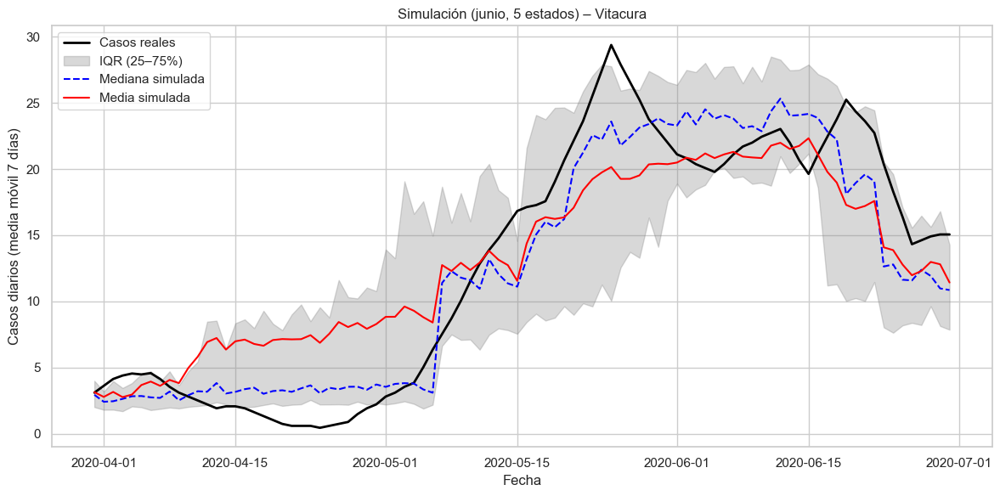

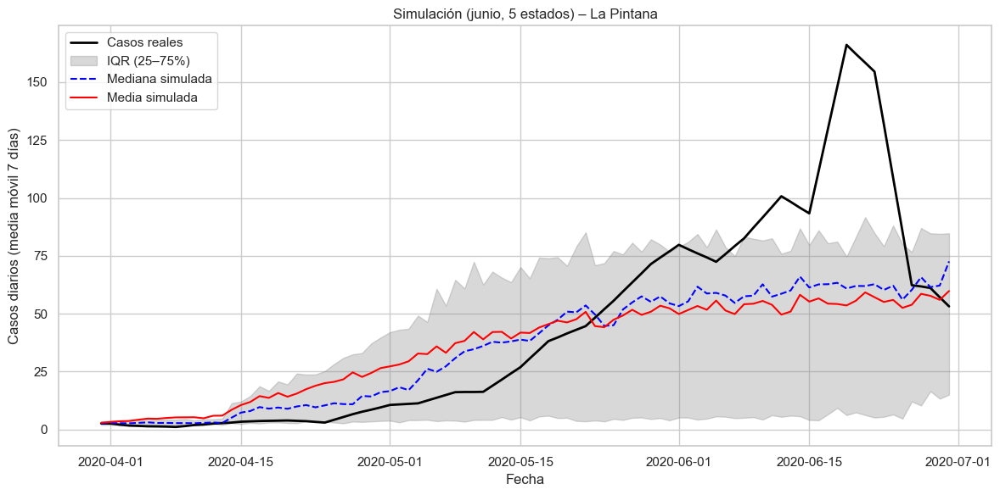

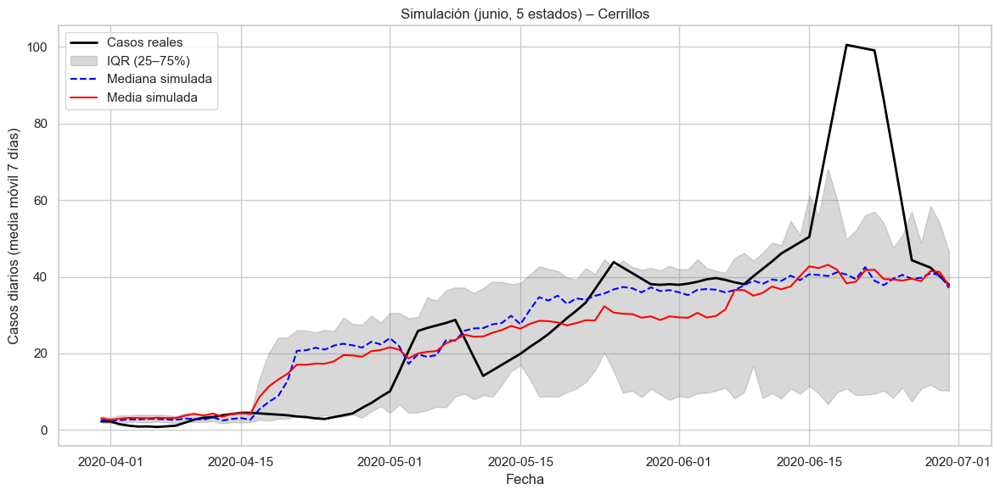

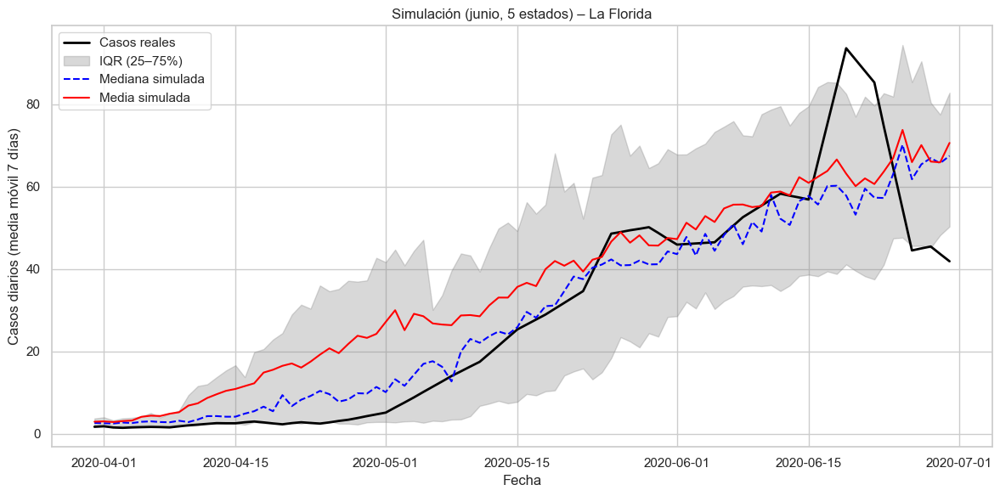

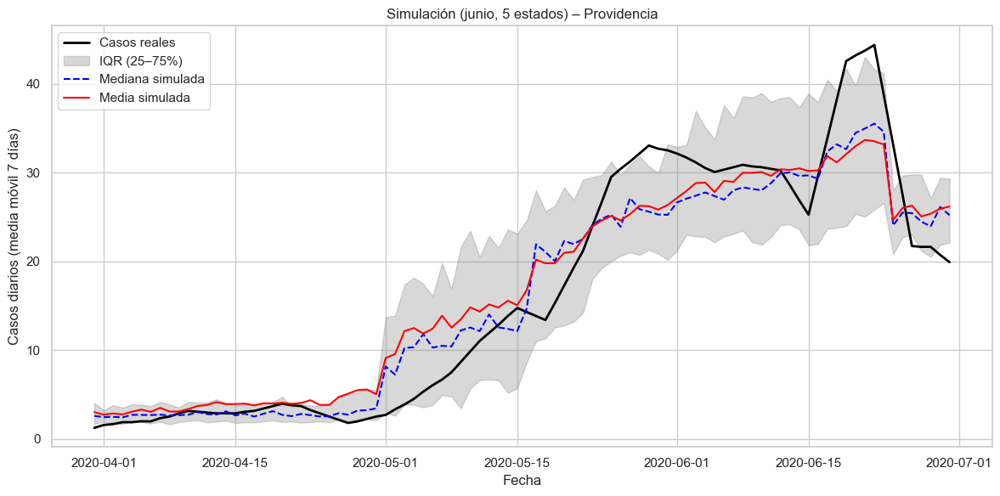

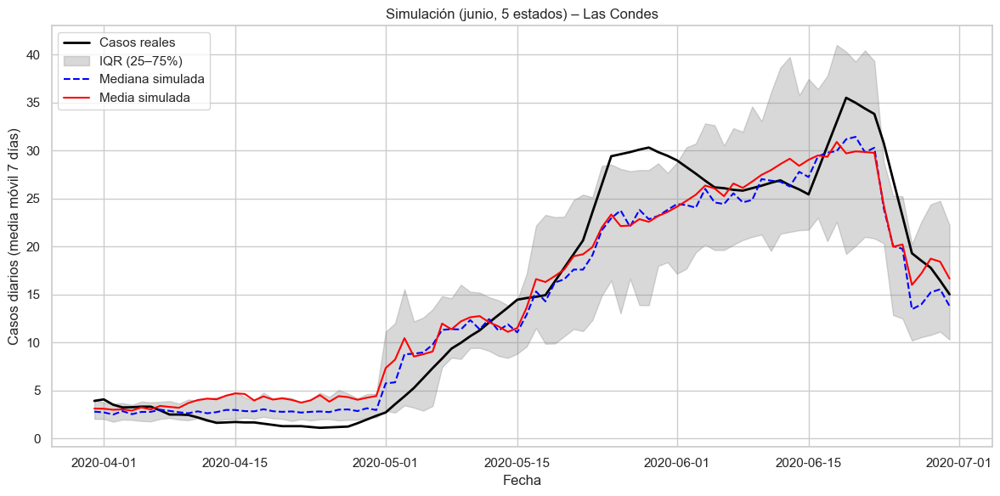

In [158]:
import matplotlib.pyplot as plt
import numpy as np

# Comunas objetivo
target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data_junio[covid_data_junio["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Simulaciones
    df_sim = sim_df_junio_5[sim_df_junio_5["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Intervalos
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación (junio, 5 estados) – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### Simulación 5 estados considerando covariable calidad urbana con data hasta junio

In [159]:
from rpy2.robjects import Formula

# Fórmulas para emisión y transición
hmm_formula_uqli_junio_5 = Formula("Gross_Daily_Cases_Mobile_Average_7_Days ~ Urban_Quality_of_Life_Index_2024")
trans_formula_uqli_junio_5 = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")


In [160]:
from rpy2.robjects.packages import importr

depmixS4 = importr("depmixS4")
gaussian_family = r["gaussian"]()

# Crear modelo con 5 estados
hmm_model_uqli_junio_5 = depmixS4.depmix(
    response=hmm_formula_uqli_junio_5,
    data=r["covid_data_junio_r"],
    nstates=5,
    family=gaussian_family,
    transition=trans_formula_uqli_junio_5,
    ntimes=r["ntimes_junio"]
)

# Ajustar el modelo
hmm_fitted_uqli_junio_5 = depmixS4.fit(hmm_model_uqli_junio_5, verbose=False)

# Exportar modelo ajustado
r.assign("hmm_fitted_uqli_junio_5", hmm_fitted_uqli_junio_5)


converged at iteration 43 with logLik: -9432.258 


<rpy2.robjects.methods.RS4 object at 0x30f21fd40> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [161]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_uqli_junio_5 <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_uqli_junio_5)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_uqli_junio_5[[i]] <- sim_vals
}}
sim_df_uqli_junio_5 <- as.data.frame(do.call(cbind, simulaciones_list_uqli_junio_5))
colnames(sim_df_uqli_junio_5) <- paste0("sim_", 1:{N_sim})
sim_df_uqli_junio_5$Commune <- covid_data_junio_r$Commune
sim_df_uqli_junio_5$Date <- as.character(covid_data_junio_r$Date)
''')


In [162]:
# Convertir desde R a pandas
sim_df_uqli_junio_5 = pandas2ri.rpy2py(r['sim_df_uqli_junio_5'])

# Asegurar que la columna 'Date' tenga el tipo correcto
sim_df_uqli_junio_5['Date'] = pd.to_datetime(sim_df_uqli_junio_5['Date'])

# Vista previa
print(sim_df_uqli_junio_5.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  0.941697  2.028924  1.109152  3.295377  3.391479  2.060096  4.722846   
2  0.439639  3.326143  4.922111  4.651223  3.825252  5.088989  4.553284   
3  2.453490  3.382283  4.026425  4.171541  0.701573  3.763079  2.920787   
4  2.260486  2.896787  2.962227  2.370252 -0.057466  0.988750  5.561361   
5  4.771236  2.945680  1.307380  2.421436  2.768555  3.762976  3.321365   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95    sim_96  \
1  0.322709  1.306381  0.939936  ...  2.050209  3.236788  0.107508  0.977640   
2 -0.680425  1.799617  3.814645  ...  1.812607  2.535103  3.226417  3.038131   
3  0.426859  2.136288  3.538452  ...  4.676482  0.192500  2.693989  2.332197   
4  1.955798  3.451836  2.406990  ...  2.294166  4.685252  2.664676  2.635309   
5  1.836560  5.130654  3.408076  ...  3.960753  3.179144  4.134596  1.577150   

     sim_97    sim_98    sim_99   sim_100    Commune       Date  
1 

In [163]:
from sklearn.metrics import mean_squared_error

rmse_uqli_junio_5 = {}
comunas_unicas = covid_data_junio['Commune'].unique()

for comuna in comunas_unicas:
    df_real = covid_data_junio[covid_data_junio['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_uqli_junio_5[sim_df_uqli_junio_5['Commune'] == comuna].sort_values('Date')

    if df_real.empty or df_sim.empty:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_uqli_junio_5[comuna] = rmse

# Convertir a DataFrame ordenado
rmse_df_uqli_junio_5 = pd.DataFrame(list(rmse_uqli_junio_5.items()), columns=['Commune', 'RMSE'])
rmse_df_uqli_junio_5 = rmse_df_uqli_junio_5.sort_values('RMSE', ascending=False)

# Mostrar
print("🔴 Comunas con mayor error (modelo UQLI - 5 estados, hasta junio):")
print(rmse_df_uqli_junio_5.head(10))

print("\n🟢 Comunas con menor error (modelo UQLI - 5 estados, hasta junio):")
print(rmse_df_uqli_junio_5.tail(10))


🔴 Comunas con mayor error (modelo UQLI - 5 estados, hasta junio):
                Commune       RMSE
10           La Pintana  30.412536
15             Lo Prado  29.322251
26             Recoleta  27.702024
31            San Ramon  26.807130
1           Cerro Navia  26.641720
25        Quinta Normal  25.022014
27                Renca  23.724142
19  Pedro Aguirre Cerda  23.571627
22             Pudahuel  23.199696
9             La Granja  22.681744

🟢 Comunas con menor error (modelo UQLI - 5 estados, hasta junio):
             Commune       RMSE
6      Independencia  11.926826
17             Maipu  10.779298
4   Estacion Central  10.647425
13      Lo Barnechea  10.080301
32          Santiago   8.770189
18             Nunoa   7.189329
11          La Reina   6.207203
21       Providencia   4.350675
33          Vitacura   4.314136
12        Las Condes   3.267725


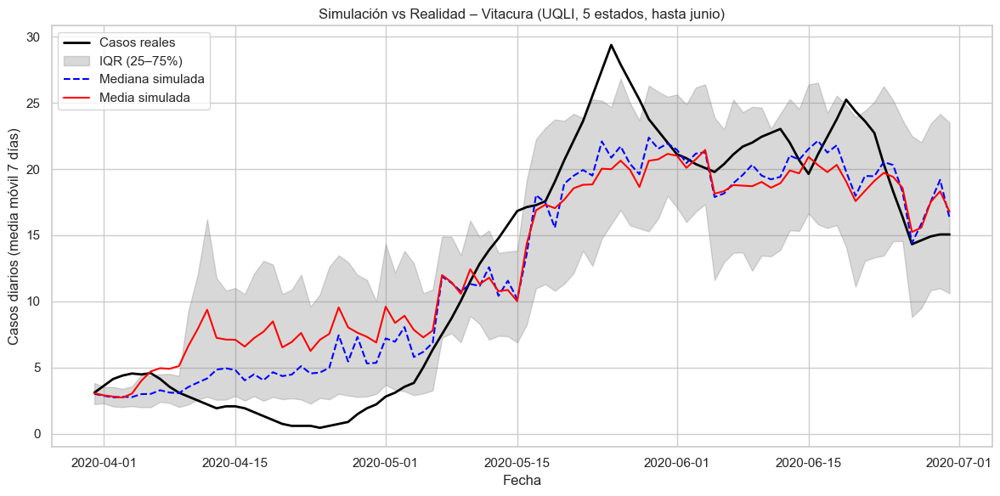

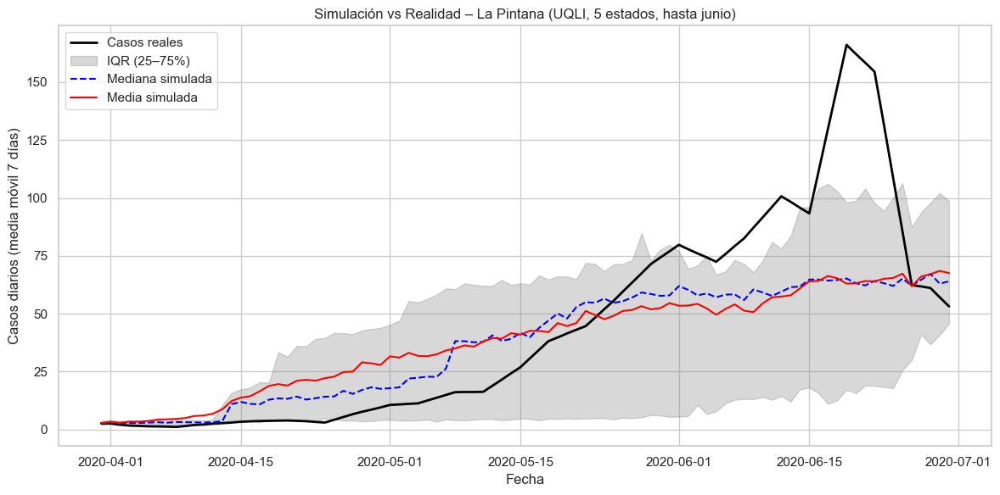

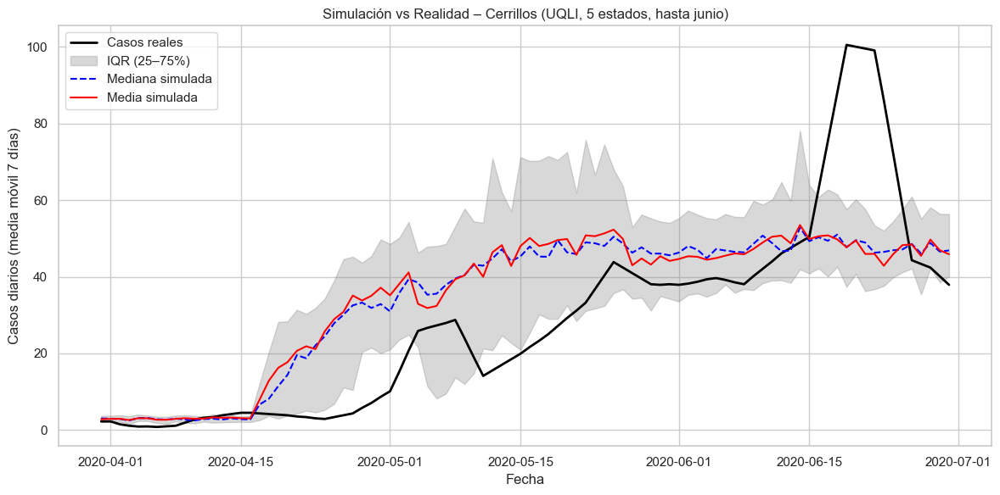

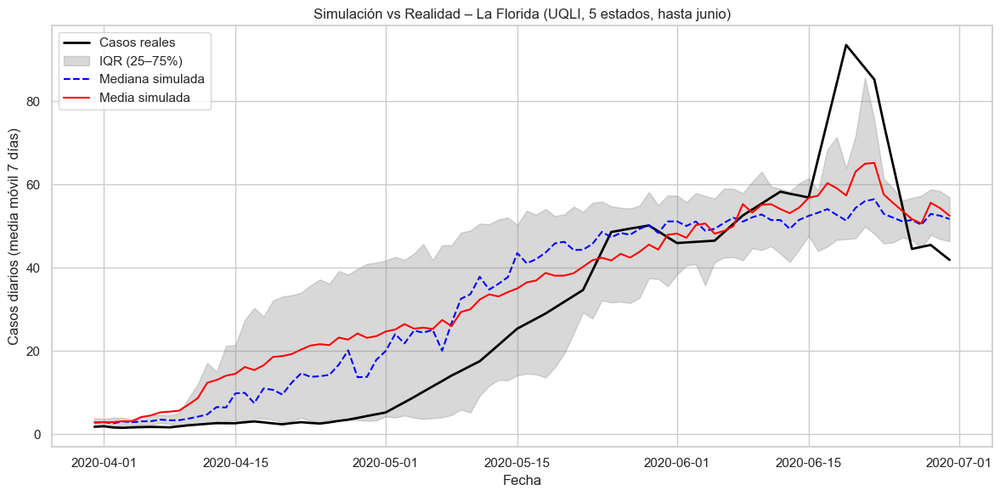

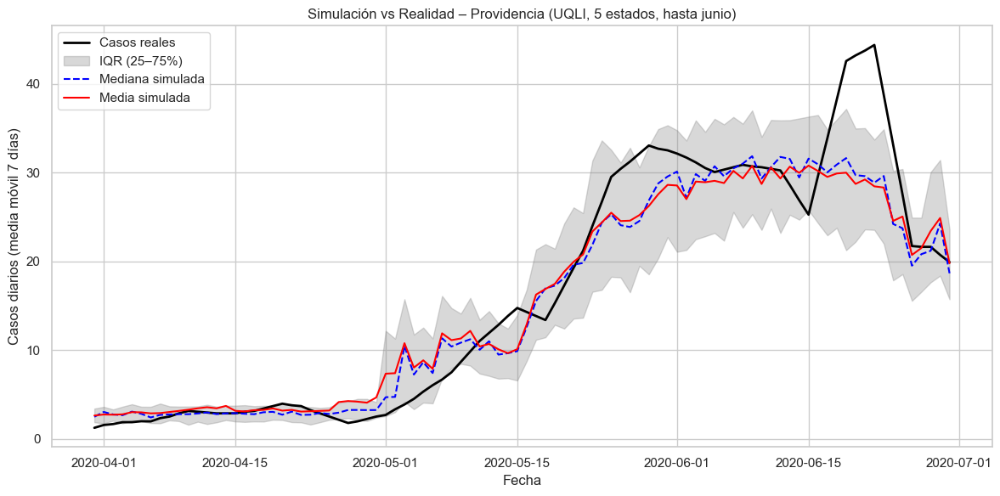

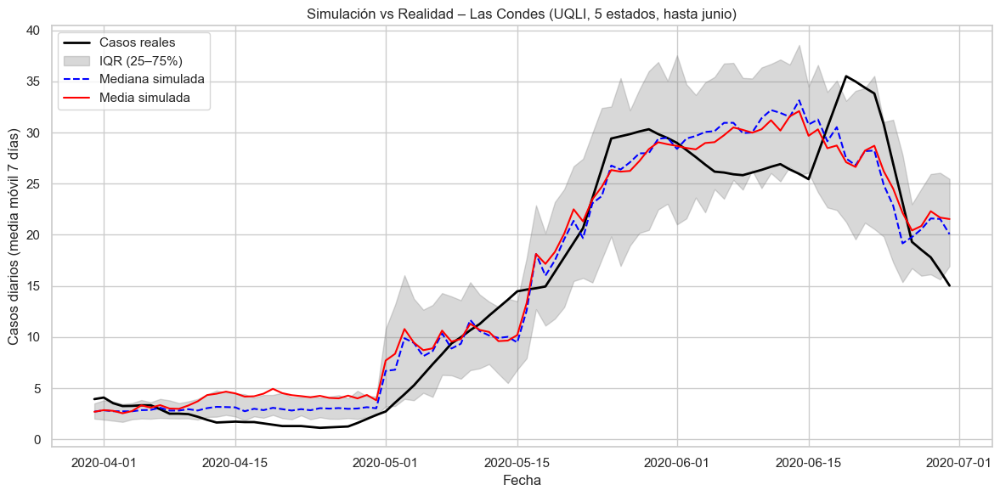

In [164]:
import matplotlib.pyplot as plt
import numpy as np

# Comunas de interés
target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data_junio[covid_data_junio["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Datos simulados
    df_sim = sim_df_uqli_junio_5[sim_df_uqli_junio_5["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación vs Realidad – {comuna} (UQLI, 5 estados, hasta junio)")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


### 5 sin boxcox ni covariables soc

In [165]:
from rpy2.robjects import Formula

# Emisión sin covariables (solo intercepto)
hmm_formula_sin_boxcox = Formula("Gross_Daily_Cases_Mobile_Average_7_Days ~ 1")

# Transición con movilidad interna, externa y comuna
trans_formula_sin_boxcox = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")


In [166]:
from rpy2.robjects.packages import importr

# Importar depmixS4 y distribución gaussiana
depmixS4 = importr("depmixS4")
gaussian_family = r["gaussian"]()

# Crear el modelo
hmm_model_nobox_5 = depmixS4.depmix(
    response=hmm_formula_sin_boxcox,
    data=r["covid_data_junio_r"],  # <- usando la data de junio
    nstates=5,
    family=gaussian_family,
    transition=trans_formula_sin_boxcox,
    ntimes=r["ntimes_junio"]
)

# Ajustar el modelo
hmm_fitted_nobox_5 = depmixS4.fit(hmm_model_nobox_5, verbose=False)

# Guardar el modelo ajustado en R
r.assign("hmm_fitted_nobox_5", hmm_fitted_nobox_5)


converged at iteration 33 with logLik: -9483.403 


<rpy2.robjects.methods.RS4 object at 0x30f058100> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [167]:
N_sim = 100

r(f'''
set.seed(1234)
simulaciones_list_nobox_5 <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted_nobox_5)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list_nobox_5[[i]] <- sim_vals
}}
sim_df_nobox_5 <- as.data.frame(do.call(cbind, simulaciones_list_nobox_5))
colnames(sim_df_nobox_5) <- paste0("sim_", 1:{N_sim})
sim_df_nobox_5$Commune <- covid_data_junio_r$Commune
sim_df_nobox_5$Date <- as.character(covid_data_junio_r$Date)
''')


In [168]:
# Convertir desde R a pandas
sim_df_nobox_5 = pandas2ri.rpy2py(r['sim_df_nobox_5'])

# Asegurar que la columna 'Date' tenga el tipo datetime
sim_df_nobox_5['Date'] = pd.to_datetime(sim_df_nobox_5['Date'])

# Vista previa
print(sim_df_nobox_5.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  3.818190  0.930004  0.377003  4.122751  2.276597  3.029456 -0.045825   
2  1.673443  2.447230  0.563156  3.348043  2.831116  2.620260  5.823494   
3  2.851727  3.097042  2.630652  4.000365  5.031543  2.454712  3.456103   
4  2.906657  2.040375  2.899164  4.770089  2.852866  3.328962  2.974786   
5  2.711911  2.115850  2.788062  2.657208  3.552136  3.399953  4.358371   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95     sim_96  \
1  2.237314  3.220979  2.880104  ...  2.783718  0.159671  1.482328   1.967052   
2  3.184689  3.474217  2.721248  ...  1.292106  2.641225  1.093011   2.206110   
3  1.473486  4.071300  4.074042  ...  5.608128  4.199912  4.845846   4.425612   
4  4.772350  3.615603  2.316215  ...  1.589557  1.255065  4.384441   8.513940   
5  5.126811  2.150182  1.286981  ...  4.183268  2.635534  3.554547  32.913244   

     sim_97    sim_98    sim_99   sim_100    Commune       Dat

In [169]:
from sklearn.metrics import mean_squared_error

rmse_nobox_5 = {}
comunas_unicas = covid_data_junio['Commune'].unique()

for comuna in comunas_unicas:
    df_real = covid_data_junio[covid_data_junio['Commune'] == comuna].sort_values('Date')
    df_sim = sim_df_nobox_5[sim_df_nobox_5['Commune'] == comuna].sort_values('Date')

    if df_real.shape[0] == 0 or df_sim.shape[0] == 0:
        continue

    y_true = df_real['Gross_Daily_Cases_Mobile_Average_7_Days'].values
    y_pred = df_sim[[col for col in df_sim.columns if col.startswith('sim_')]].mean(axis=1).values

    if len(y_true) != len(y_pred):
        continue

    rmse = mean_squared_error(y_true, y_pred, squared=False)
    rmse_nobox_5[comuna] = rmse

# Convertir a DataFrame
rmse_df_nobox_5 = pd.DataFrame(list(rmse_nobox_5.items()), columns=['Commune', 'RMSE'])
rmse_df_nobox_5 = rmse_df_nobox_5.sort_values('RMSE', ascending=False)

# Mostrar
print("🔴 Comunas con mayor error (sin Box-Cox, 5 estados):")
print(rmse_df_nobox_5.head(10))

print("\n🟢 Comunas con menor error (sin Box-Cox, 5 estados):")
print(rmse_df_nobox_5.tail(10))


🔴 Comunas con mayor error (sin Box-Cox, 5 estados):
          Commune       RMSE
10     La Pintana  31.679449
15       Lo Prado  28.482640
1     Cerro Navia  27.303109
31      San Ramon  26.491053
27          Renca  25.941246
25  Quinta Normal  24.522966
22       Pudahuel  24.244986
26       Recoleta  23.224192
2        Conchali  23.223405
9       La Granja  22.803977

🟢 Comunas con menor error (sin Box-Cox, 5 estados):
             Commune       RMSE
6      Independencia  12.613391
4   Estacion Central  11.166424
17             Maipu  11.059876
13      Lo Barnechea   9.032280
32          Santiago   8.211417
11          La Reina   7.633367
33          Vitacura   6.352542
18             Nunoa   6.302375
21       Providencia   5.217205
12        Las Condes   4.121009


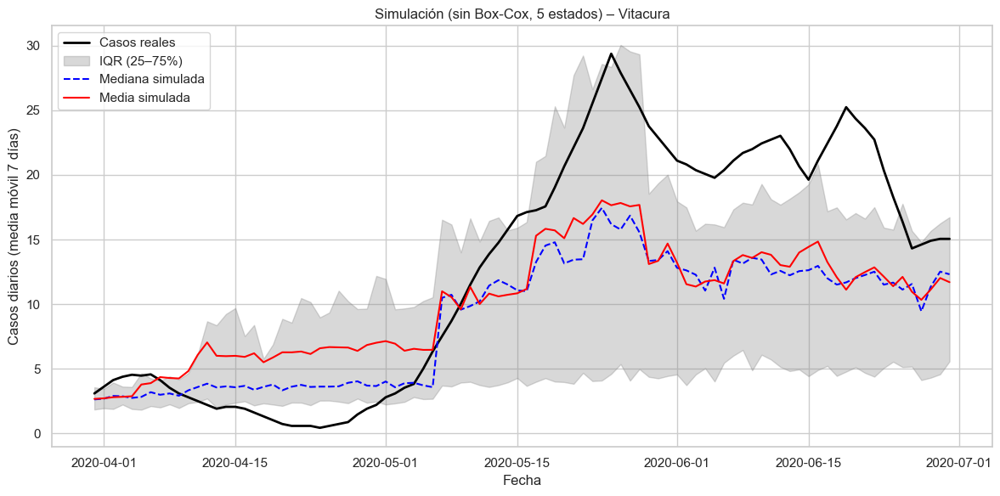

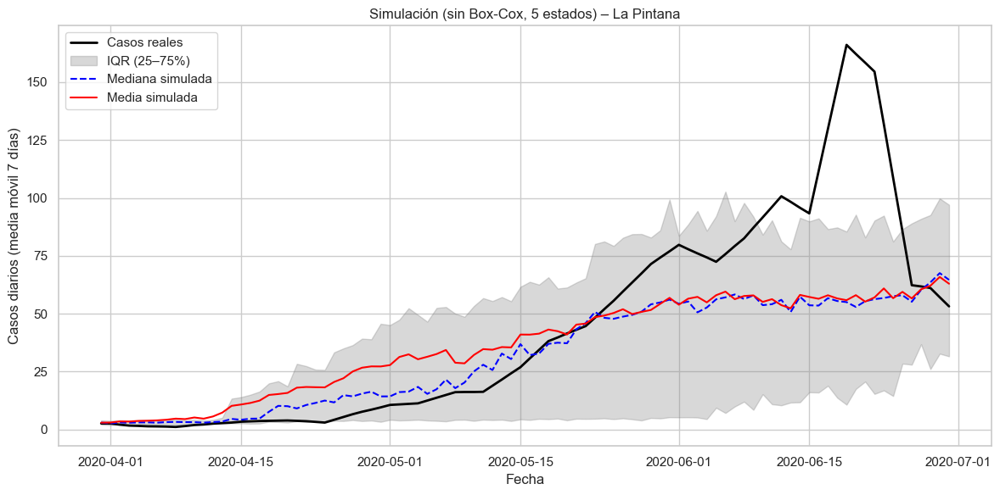

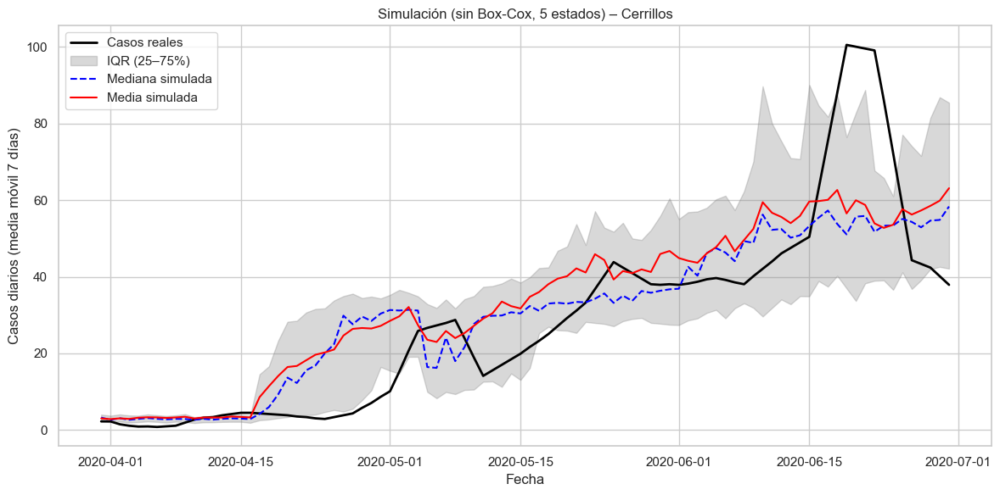

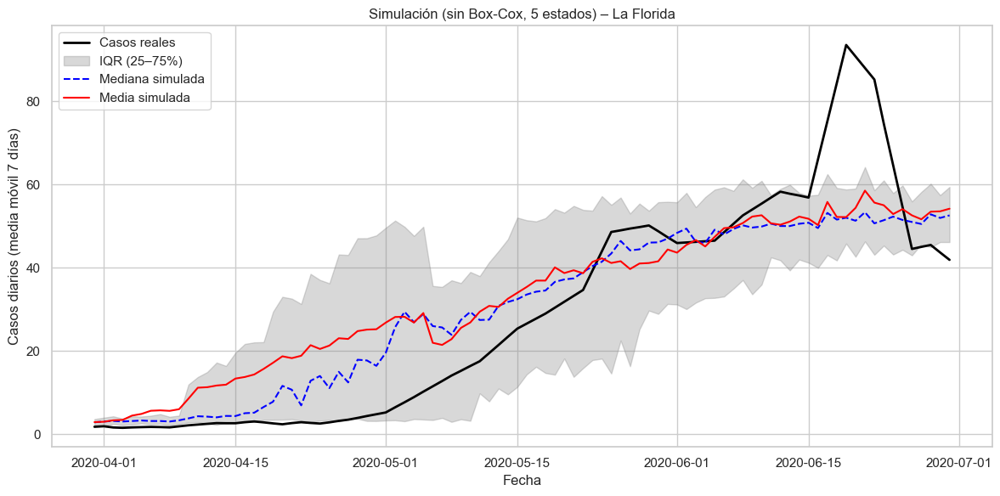

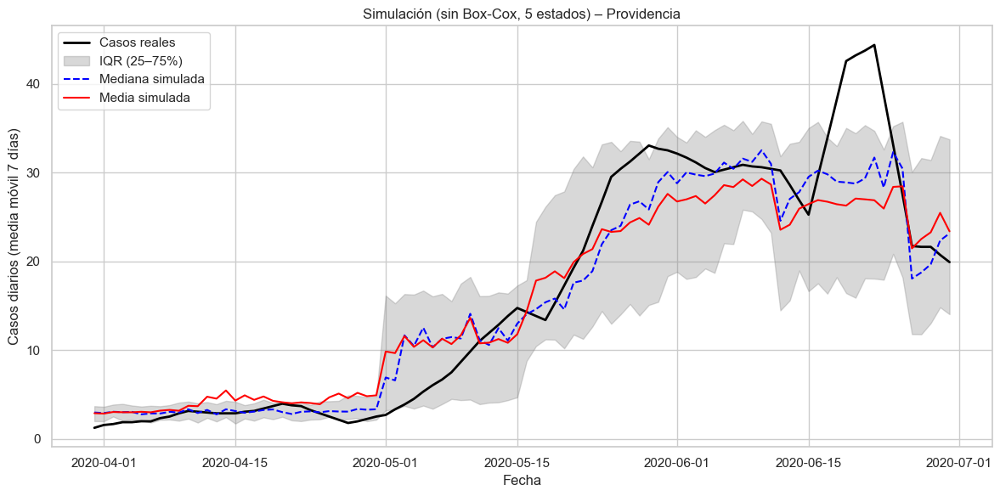

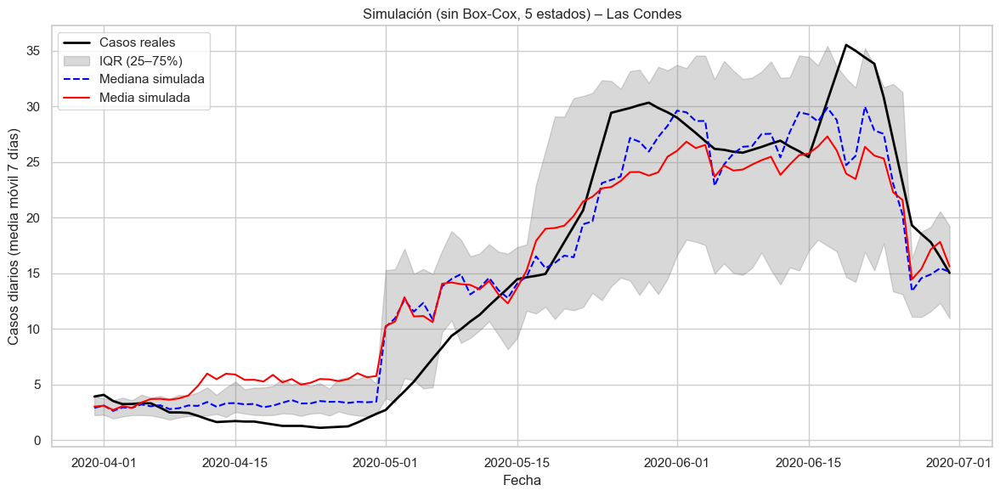

In [170]:
import matplotlib.pyplot as plt
import numpy as np

target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data_junio[covid_data_junio["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Simulaciones
    df_sim = sim_df_nobox_5[sim_df_nobox_5["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Simulación (sin Box-Cox, 5 estados) – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()


In [171]:
from rpy2.robjects import pandas2ri, r
pandas2ri.activate()

# Enviar datos completos a R
r.assign("covid_data_r", pandas2ri.py2rpy(covid_data))
r.assign("ntimes", pandas2ri.py2rpy(ntimes))

# Transformación Box-Cox en R
r('''
library(depmixS4)
library(MASS)

lambda <- 0.01  # valor recomendado por el profe
covid_data_r$boxcox_cases <- ifelse(
  covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days > 0,
  (covid_data_r$Gross_Daily_Cases_Mobile_Average_7_Days^lambda - 1) / lambda,
  0
)
''')


In [172]:
from rpy2.robjects import Formula
from rpy2.robjects.packages import importr

# Importar paquete
depmixS4 = importr("depmixS4")
gaussian_family = r["gaussian"]()

# Fórmulas
hmm_formula = Formula("boxcox_cases ~ 1")
trans_formula = Formula("~ Internal_Mobility_Index + External_Mobility_Index + Commune")

# Modelo con 5 estados
hmm_model = depmixS4.depmix(
    response=hmm_formula,
    data=r["covid_data_r"],
    nstates=5,
    family=gaussian_family,
    transition=trans_formula,
    ntimes=r["ntimes"]
)

# Ajustar el modelo
hmm_fitted = depmixS4.fit(hmm_model, verbose=False)

# Guardar para simulación
r.assign("hmm_fitted", hmm_fitted)


converged at iteration 117 with logLik: -1544.807 


<rpy2.robjects.methods.RS4 object at 0x30ea01280> [RTYPES.S4SXP]
R classes: ('depmix.fitted',)

In [173]:
N_sim = 100

r(f'''
set.seed(1234)

simulaciones_list <- vector("list", {N_sim})
for (i in 1:{N_sim}) {{
  sim <- simulate(hmm_fitted)
  sim_vals <- sim@response[[1]][[1]]@y
  simulaciones_list[[i]] <- (0.01 * sim_vals + 1)^(1 / 0.01)  # Inversa de Box-Cox
}}

sim_df <- as.data.frame(do.call(cbind, simulaciones_list))
colnames(sim_df) <- paste0("sim_", 1:{N_sim})
sim_df$Commune <- covid_data_r$Commune
sim_df$Date <- as.character(covid_data_r$Date)
''')


In [174]:
# Convertir a DataFrame de pandas
sim_df = pandas2ri.rpy2py(r['sim_df'])

# Arreglar columna de fecha
sim_df['Date'] = pd.to_datetime(sim_df['Date'])

# Vista previa
print(sim_df.head())


      sim_1     sim_2     sim_3     sim_4     sim_5     sim_6     sim_7  \
1  2.646510  1.938992  2.350296  2.784611  5.706224  2.522172  2.100285   
2  3.113402  2.500841  1.789346  1.059920  2.352170  2.481778  4.205274   
3  3.374022  6.106429  2.310836  2.470976  0.589103  4.664745  1.357028   
4  3.332765  5.473869  2.536654  3.078026  5.188462  2.110570  2.634877   
5  2.318012  5.890789  1.635746  4.818379  2.425245  3.360527  1.603388   

      sim_8     sim_9    sim_10  ...    sim_93    sim_94    sim_95    sim_96  \
1  2.377779  2.932360  2.988668  ...  2.523097  2.156187  5.903335  1.820510   
2  2.862879  2.937431  4.370119  ...  2.065074  3.409864  4.691008  2.795973   
3  3.943943  4.956206  1.997221  ...  2.419969  2.918413  2.377210  2.711193   
4  3.280072  3.031648  2.067835  ...  6.103862  1.317842  3.767794  2.722465   
5  1.358287  3.133461  1.376495  ...  1.589053  3.359647  2.834892  2.495757   

     sim_97    sim_98    sim_99   sim_100    Commune       Date  
1 

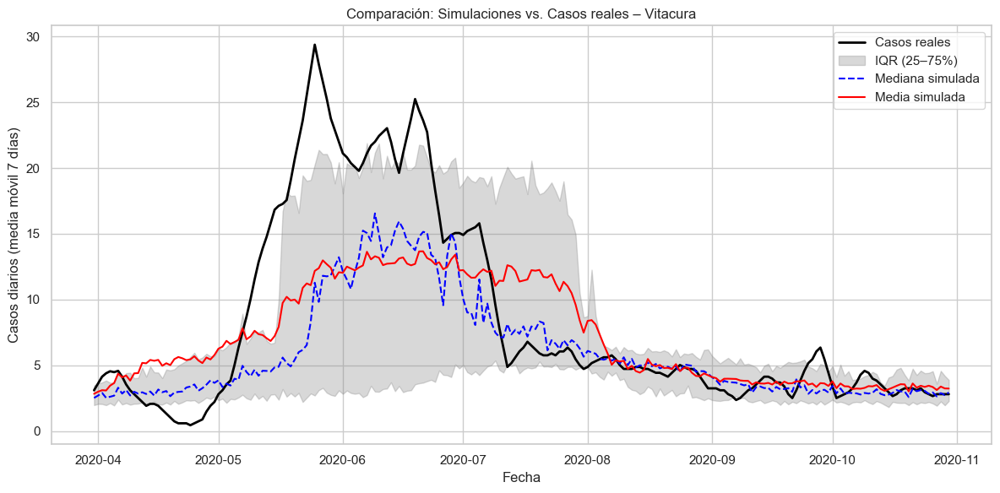

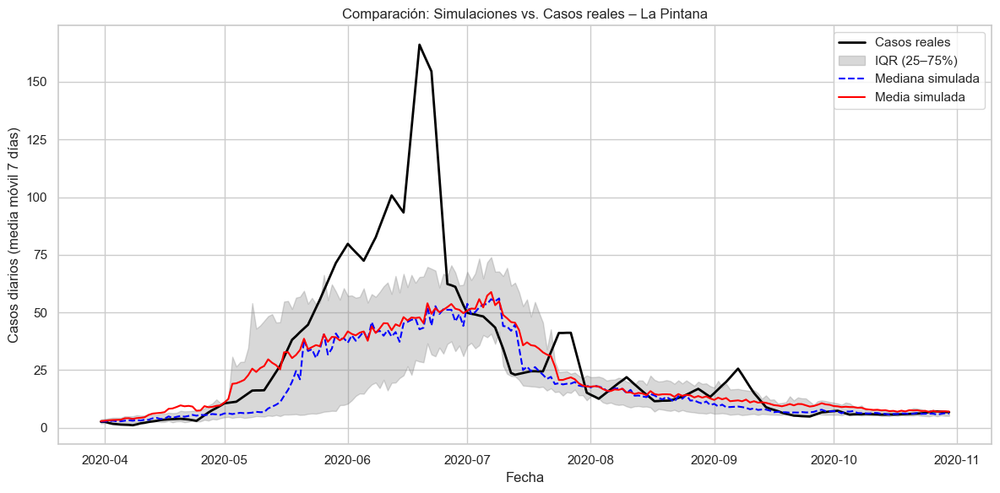

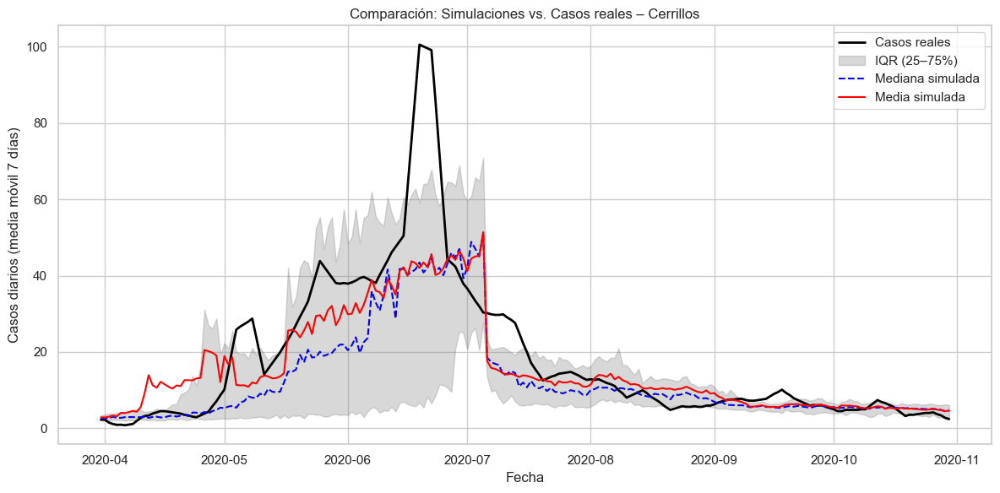

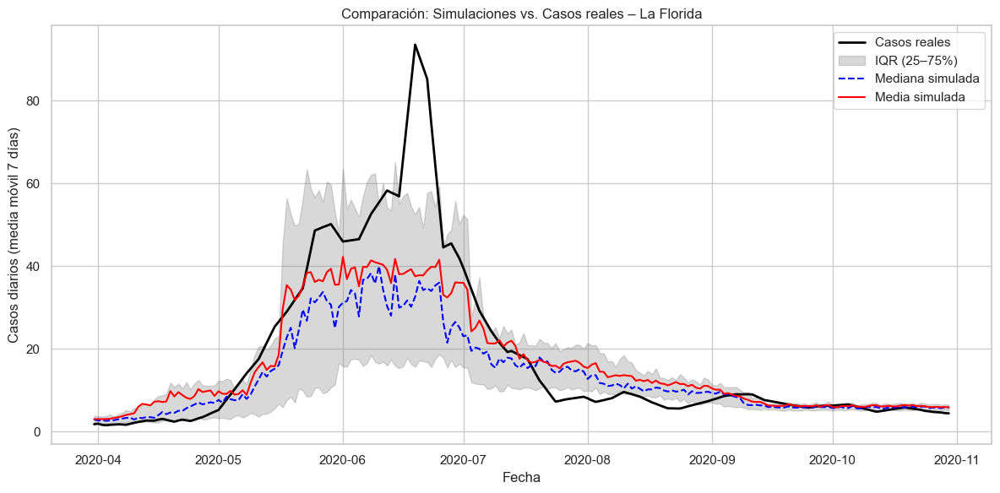

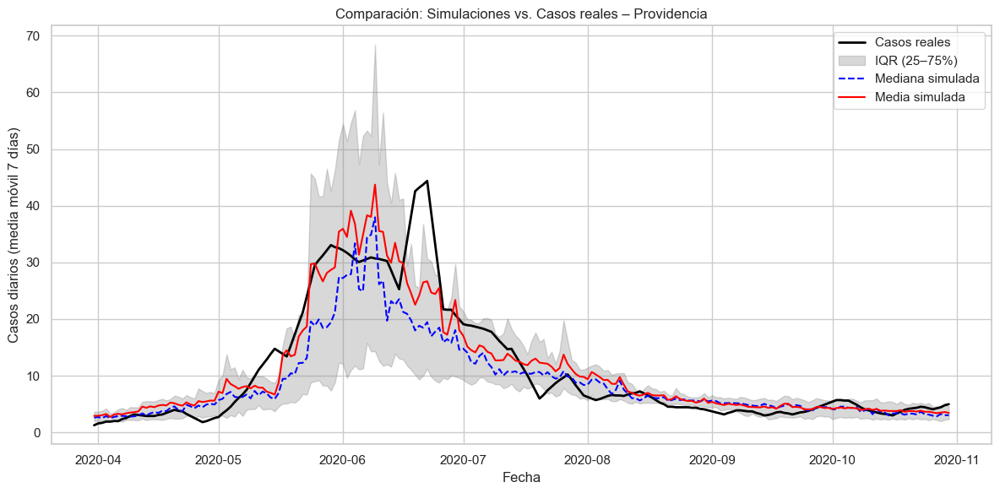

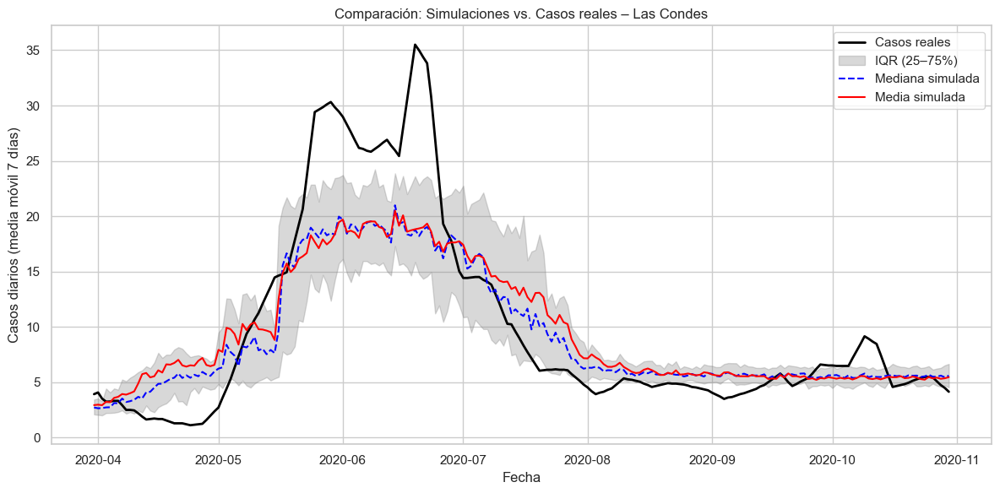

In [175]:
import matplotlib.pyplot as plt
import numpy as np

# Comunas objetivo
target_communes = ["Vitacura", "La Pintana", "Cerrillos", "La Florida", "Providencia", "Las Condes"]

for comuna in target_communes:
    plt.figure(figsize=(12, 6))

    # Datos reales
    df_real = covid_data[covid_data["Commune"] == comuna].sort_values("Date")
    plt.plot(df_real["Date"], df_real["Gross_Daily_Cases_Mobile_Average_7_Days"],
             label="Casos reales", linewidth=2, color="black")

    # Datos simulados
    df_sim = sim_df[sim_df["Commune"] == comuna].sort_values("Date")
    sim_cols = [col for col in df_sim.columns if col.startswith("sim_")]
    sim_values = df_sim[sim_cols].values
    dates = df_sim["Date"].values

    # Estadísticas
    p25 = np.percentile(sim_values, 25, axis=1)
    p50 = np.percentile(sim_values, 50, axis=1)
    p75 = np.percentile(sim_values, 75, axis=1)
    mean = sim_values.mean(axis=1)

    # Gráfico
    plt.fill_between(dates, p25, p75, color="gray", alpha=0.3, label="IQR (25–75%)")
    plt.plot(dates, p50, linestyle="--", color="blue", label="Mediana simulada")
    plt.plot(dates, mean, linestyle="-", color="red", label="Media simulada")

    plt.title(f"Comparación: Simulaciones vs. Casos reales – {comuna}")
    plt.xlabel("Fecha")
    plt.ylabel("Casos diarios (media móvil 7 días)")
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()
